# <center>LEt-SNE: A Hybrid Approach to Data Embedding and <br> Visualization of Hyperspectral Imagery</center>

### <center>Megh Shukla</center>

Accepted for publication in the *45th International Conference of Acoustics, Speech and Signal Processing* (**ICASSP 2020**). This repository contains the implementation and general discussion of the accompanying paper. Implementation is based on *TensorFlow 1.13*, the high performance GPU computing library. The author can be mailed at: work.meghshukla@gmail.com<br>
Note: We recommend reading the [paper](https://arxiv.org/abs/1910.08790) before going through the notebook.

---
#### <center> Description </center>
---

While dealing with hyperspectral imagery (or high dimensional datasets), we often encounter the phenomenon of the **curse of dimensionality**. Recall that the curse of dimensionality states that with increasing dimensionality, the concept of *neighbours* is lost. This is defined as:
<center>
$\lim_{d\to\infty} \, \mathbb{E} \, (\frac{dist_{max}(d) - dist_{min}(d)}{dist_{min}(d)})\to0$
</center>

For a fixed sample in $\mathbb{R}^n$, the distance between the farthest and the nearest sample is negligible when compared to the distance between sample to its nearest neighbour. This can be seen in the graph below: 

<center>
<img src="https://drive.google.com/uc?id=1nSMpt8tNi7lPaI54rwNl3qpFDLXydzG0" alt="CoD"
	title="Curse of Dimensionality" width="480" />
</center>

A consequence of this is that samples are nearly equidistant from each other in very high dimensional spaces, hence making the use of euclidean distances void. Many algorithms that make the use of euclidean distance therefore are not able to perform well with dimensionality reduction of hyperspectral images.

The novelty in our paper is the introduction of a new algorithm, *LEt-SNE*, which combines Laplacian Eigenmaps (LE) and t-distributed Stochastic Neighbourhood Encoding (t-SNE) into a model parameterized
by a shallow feed forward network. With *LEt-SNE: (Laplacian Eigenmaps + t-SNE)*, we address the issue of the curse of dimensionality by introducing **Compression Factor (CF)**. This new term combats the curse of dimensionality by creating an illusion of bringing *related samples* closer and keeping *dissimilar samples* apart, stretching inter-sample distances. Our formulation of the compression factor is discussed in the subsequent section. 

We attempt to solve a three-fold problem with our approach: 
- Manifold Visualization
- Clustering with labelled samples
- Clustering with unlabelled samples

For evaluation, we compare the results of the proposed algorithm on open source remote sensing datasets: Indian Pines, Salinas and Pavia University with other popular, state of the art approaches. Our comparisons include visualizing embeddings, classification maps and confusion matrices for all the datasets.

---
#### <center>Requirements </center>
---

This code has been tested with Python 3.6, with the following external libraries:

- tensorflow == 1.13.2
- tensorflow-gpu == 1.13.2 (for GPU support, highly recommended)
- umap-learn == 0.3.10
- scikit-learn == 0.20.3
- scipy == 1.2.1
- scikit-image == 0.15.0
- pandas == 0.24.2
- numpy == 1.16.3
- matplotlib == 3.0.3

To install these, create a separate environment using:
```
python3 -m venv LEt-SNE_environment
source ./LEt-SNE_environment/bin/activate
pip install -r LEt-SNE_requirements.txt
```



## Part 1: Installations

Install required libraries in a new virtual environment.<br>
Ensure _nvidia-smi_ detects atleast one GPU. If _nvidia-smi_ fails, try resetting the environment with accelerator chosen as GPU.

In [1]:
# If using with Google Colab, restart the runtime if prompted
# Resetting the runtime ensures correct version of a library is selected
!sudo apt-get update
!sudo apt install python3-venv libnvidia-common-430 unrar               # Needed if using Google Colab
!python3 -m venv LEt-SNE_environment                            # Create a new environment and activate it 
!source LEt-SNE_environment/bin/activate; pip install -r LEt-SNE_requirements.txt

!unrar x Dataset.rar
!rm -rf Dataset.rar
!nvidia-smi

Ign:1 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  InRelease
Get:2 http://ppa.launchpad.net/graphics-drivers/ppa/ubuntu bionic InRelease [21.3 kB]
Get:3 http://security.ubuntu.com/ubuntu bionic-security InRelease [88.7 kB]
Ign:4 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  InRelease
Hit:5 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  Release
Hit:6 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  Release
Hit:7 http://archive.ubuntu.com/ubuntu bionic InRelease
Get:8 http://archive.ubuntu.com/ubuntu bionic-updates InRelease [88.7 kB]
Get:11 http://ppa.launchpad.net/marutter/c2d4u3.5/ubuntu bionic InRelease [15.4 kB]
Get:12 http://archive.ubuntu.com/ubuntu bionic-backports InRelease [74.6 kB]
Get:13 http://ppa.launchpad.net/graphics-drivers/ppa/ubuntu bionic/main amd64 Packages [37.4 kB]
Get:14 http://security.ubuntu.com/ubuntu bionic-security/unive

## Part 2: Setting up the experiment

If all the installations are successfully completed, the following code block will execute smoothly. In the event of an error message, try re-running the script from scratch.
We import the required libraries, set the path for TensorBoard and define hyperparameters needed for the experiments.

Setting up the necessary imports:
- _TensorFlow_: High performance GPU implementation of LEt-SNE.
- _scikit-learn_: Facilitates the use of PCA, LDA, t-SNE and SVC.
- _umap-learn_: Contains the UMAP algorithm, as described in [UMAP-arXiv](https://arxiv.org/abs/1802.03426).
- _scikit-image_: Needed when using segmentation algorithms such as SLIC and Watershed
- _matplotlib_: Visualization of the embeddings, classification maps and confusion matrices.

In [2]:
# If using with Google Colab, set TensorFlow to version 1.x
%tensorflow_version 1.x

# Python imports
import os
import sys
import time
import random
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# Libraries for core LEt-SNE implementation
import numpy as np
import tensorflow as tf

# Segmentation algorithms
from skimage import morphology
from skimage.segmentation import slic

# Visualization
from matplotlib import cm
from matplotlib import pyplot as plt
from matplotlib import pylab as pylab
from mpl_toolkits.mplot3d import axes3d
plt.rcParams['figure.figsize'] = [25/2.54, 25/2.54]
plt.rcParams['figure.dpi'] = 300

# Popular / SOTA algorithms
import umap
from sklearn.svm import SVC
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA

# Evaluation
from sklearn.metrics import confusion_matrix
from sklearn.metrics import cohen_kappa_score
from sklearn.utils.multiclass import unique_labels

# Miscellaneous imports
import scipy.io
from skimage import color
from skimage import filters
from skimage import exposure
from scipy import ndimage as ndi
from skimage import img_as_ubyte
from skimage.future import graph
from skimage.util import img_as_float
from skimage.exposure import histogram
from scipy.spatial.distance import pdist
from scipy.spatial.distance import squareform
from tensorflow.contrib.layers import l2_regularizer as l2_reg

TensorFlow 1.x selected.


We set the random seed in an attempt to improve reproducibility. \
We also define a unique path for TensorBoard and the path to the Dataset Folder.

In [3]:
# Setting the seed to a fixed value for reproducibility purpose
# Based on https://medium.com/@ODSC/properly-setting-the-random-seed-in-ml-experiments-not-as-simple-as-you-might-imagine-219969c84752
seed_value = 0
os.environ['PYTHONHASHSEED']=str(seed_value)
random.seed(seed_value)
np.random.seed(seed_value)
tf.set_random_seed(seed_value)

# Location of current file
FILE_DIR = os.path.dirname(os.path.abspath("__file__"))

# Create the master TensorBoard directory ensuring a unique one is crated
TENSORBOARD_DIR = os.path.join(FILE_DIR, 'TensorBoard')
append=1
while os.path.exists(os.path.join(TENSORBOARD_DIR + '_' + str(append))):
    append += 1
TENSORBOARD_DIR = os.path.join(TENSORBOARD_DIR + '_' + str(append))
os.mkdir(TENSORBOARD_DIR)

DATASET = os.path.join(FILE_DIR, "Dataset")

# Setting runtime options
np.set_printoptions(threshold=np.inf)                             # To print all elements of np array without truncation
tf.logging.set_verbosity(tf.logging.INFO)

# allow growth = True eliminates TF 1.13 cuDNN error
if tf.__version__[:4] == '1.13':
    config = tf.ConfigProto()
    config.gpu_options.allow_growth = True
else:
    config = None

tf.logging.info('TensorBoard directory: {}'.format(TENSORBOARD_DIR))
tf.logging.info('Dataset directory: {}'.format(DATASET))

INFO:tensorflow:TensorBoard directory: /content/TensorBoard_1
INFO:tensorflow:Dataset directory: /content/Dataset


#### Global Declarations:<br>

1. Choosing the mode of operation:
 
  - MANIFOLD: Manifold Visualization
  - LABEL: Clustering with labelled samples
  - SEGMENTATION: Clustering with unlabelled samples

2. FCC Visualization: Choose the bands which are used to visualize the False Color Composite of the Satellite Image

3. Placeholders related to the input image: Image dimensions (shape), statistics per channel of the input image, and ground truth labels.

4. Result Visualization: Boolean constants to plot the image classification map, confusion matrix.

5. Compute:Deciding which algorithms should be used for comparison with LEt-SNE.

6. Debugging: The LOG_* variables are used to output intermediate values which could be used for debugging purposes. 
These values include printing the adjacency graph computed by Laplacian Eigenmaps, Perplexity debugging, L2-distance between the embeddings and the embeddings themselves. 

In [0]:
MANIFOLD = False
LABEL = True
SEGMENTATION = False

assert (MANIFOLD + SEGMENTATION + LABEL) == 1, "Choose any one approach:" \
                                               "1. Manifold Visualization" \
                                               "2. Segmentation based Unsupervised Data visualization and Clustering" \
                                               "3. Label information based Data visualization and Clustering"

# FCC visualization
RED = 50                             # VNIR Band   IndianPines/Salinas: 50  Pavia: 90
GREEN = 27                           # RED Band                         27         50
BLUE = 17                            # GREEN Band                       17         10

# Input Image Declaration
IMG_DIM = []                         # Dimensions of the hyperspectral image
INDEX_NO_CLASS = []                  # Index of background pixels
PIXEL_MEAN = []                      # Standardization: Holds the mean value per channel
PIXEL_SD = []                        # Standardization: Holds the standard deviation value per channel
GROUND_TRUTH = []                    # Updated to reflect the name of the classes contained in the dataset

TRAIN_SPLIT = 0.5                    # Training-Testing Split ratio
DISPLAY_CLASS_MAP = True             # Displays the classification map of the image
DISPLAY_CONFUSION = True             # Displays the confusion matrix for each algorithm

# Global constants for the purpose of debugging
LOG_TENSOR = [False, False, False, False]     # Debug: Graph_Adjacency, Perplexity, Embedding pairwise l2norm, embedding
LOG_TENSOR_DICT = {}                          # Will contain various attributes to log

#### Hyperparameter and Training Initialization:

The values of NUM_BANDS indicate the input dimensionality of our dataset. NUM_CLASSES represents the number of classes present in our datasets, including the background class.

LEt-SNE hyperparameters include:
  1. **Perplexity**: Plays the role of determining the scale of embeddings. Unlike t-SNE, perplexity is not a soft measure to account for sample density.

  2. **Tolerance**: t-SNE and LEt-SNE rely on binary search to identify the variance parameter for the neighbourhood gaussian distribution. Tolerance relaxes the perplexity requirement by allowing a *perplexity +- tolerance margin*. 

  3. **Compression Factor**: The compression factor is a term introduced to stretch the probabilities, which in turn creates an illusion of larger separation between dissimilar samples. A high value of compression factor saturates the probabilities, with connected samples being equally probable to be neighbours, and dissimilar samples having extremely low probabilities of being neghbours for a particular point.

  4. **Number of Neighbours**: Determines the neighbourhood of a sample. If mode of use is LABELLING or CLUSTERING, the number of neighbours is inferred from the mini-batch input to the Multilayer Perceptron. If the mode is MANIFOLD, then number of neighbours depends upon the minibatch size, number of classes, and a scaling factor to accomodate rare classes.


Other hyperparameters of interest include the BATCH_SIZE, which is an important criteria since the adjacency graph is computed over the entire minibatch. DIM_REDUCED indicates the dimensionality of our reduced data. LOSS_WEIGHTS control the contribution of various terms in our minimization objective $[\lambda_{LE}, \lambda_{t-SNE}, \lambda_{Reconstruction}]$. In LEt-SNE, the objectives of Laplacian Eigenmaps and t-SNE are conflicting, which can be controlled by tuning the corresponfing $\lambda s$. We use the same architecture of LEt-SNE to construct the encoder-decoder, hence LOSS_WEIGHTS = [0, 0, 1] corresponds to an Autoencoder training.


In [0]:
# General
NUM_BANDS = None                     # Determined from the dataset
NUM_CLASSES = 0                      # Automatically inferred from the dataset : Salinas, IndianPines, Pavia University
NUM_EPOCHS = 300                     # Indian_Pines = 350 (Manifold) 1000 (Seg + Label)
                                     # Salinas, Pavia_U = 100 (Manifold) 300 (Seg + Label)

# LEt-SNE
PERPLEXITY = 45                      # Determines scale of embedding unlike t-SNE interpretation
TOLERANCE = 0.1                      # Acceptable deviation from the perplexity
COMPRESSION_FACTOR = 150             # Multiplicative factor to boost probabilities of samples having same class
NUM_NEIGHBOURS = 0                   # BATCH_SIZE // (5 * NUM_CLASSES), Updated if MANIFOLD == True in load_data()
# If non-zero (MANIFOLD), uses k-nearest neighbours to compute adjacency;
# '0' (Unsupervised SEGMENTATION + LABEL) uses labels info OR segmented regions

# Model Parameters
BATCH_SIZE = 1024
DIM_REDUCED = 2
HIDDEN = [DIM_REDUCED]               # Number of nodes in hidden layer(s)
LOSS_REGULARIZATION = 0.0
LEARNING_RATE = 0.001

LOSS_WEIGHTS = np.array([0.01, 1.0, 0.0], dtype=np.float32)
# [Laplacian Eigenmap, t-SNE = 1 (SEG, LAB) = 5 (MANIFOLD), Reconstruction]

## Part 3: Visualizing the dataset

**Preprocessing - 1:**  
Load the dataset of choice and standardize each channel ($i$) of the image with $\mu_i=0$ and $\sigma_i=1$ and set the Ground Truth labels for the chosen dataset. The dataset is flattened along the spatial dimensions (_dim_ = 0, 1) since clustering / visualization is done on a per pixel basis.

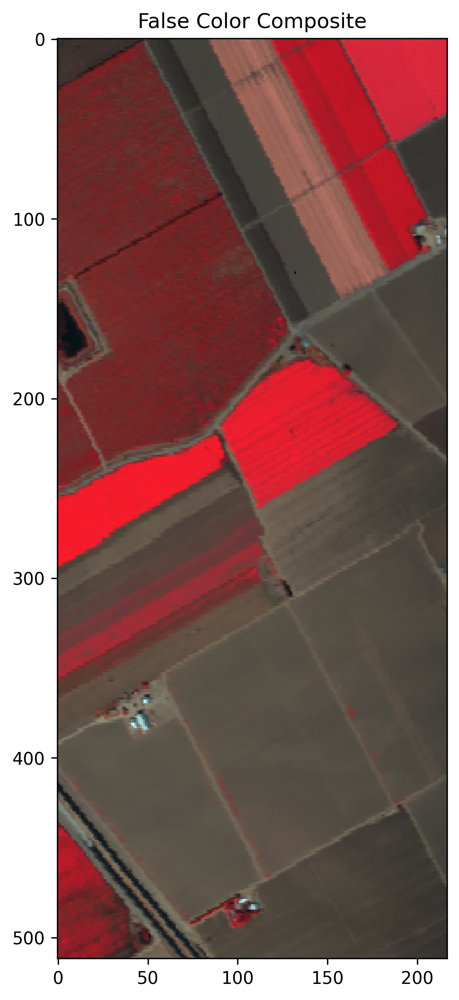

In [6]:
def load_data(indian_pines=False, salinas=False, pavia=False, display=False):
    '''
    NUMPY
    Loads dataset of interest and normalizes it with zero mean and unit variance.
    Optionally, can also display the FCC of the data
    :param indian_pines: boolean (default: False), loads indian_pines when True
    :param salinas: boolean (default: False), loads salinas when True
    :param pavia: boolean (default: False), loads pavia when True
    :param display: boolean (default: False), displays FCC when True
    :return:  2D Numpy array (H*W, C) of band data and ground truth (H*W)
    '''

    global GROUND_TRUTH
    global NUM_CLASSES
    global NUM_NEIGHBOURS
    data = None
    data_gt = None
    assert (indian_pines + salinas + pavia) == 1, "Select ONE dataset"            # Only one dataset should be True
    # Loading Indian Pines dataset
    if indian_pines:
        data = scipy.io.loadmat(os.path.join(DATASET, "Indian_pines/Indian_pines_corrected.mat"))
        data_gt = scipy.io.loadmat(os.path.join(DATASET, "Indian_pines/Indian_pines_gt.mat"))
        data = data['indian_pines_corrected'].astype(np.float32)
        data_gt = data_gt['indian_pines_gt'].astype(np.uint8)
        GROUND_TRUTH = ['Background', 'Alfalfa', 'Corn-notill', 'Corn-mintill', 'Corn', 'Grass-pasture', 'Grass-trees',
                        'Grass-pasture-mowed', 'Hay-windrowed', 'Oats', 'Soybean-notill', 'Soybean-mintill',
                        'Soybean-clean', 'Wheat', 'Woods', 'Buildings-Grass-Trees-Drives', 'Stone-Steel-Towers']
        NUM_CLASSES = len(GROUND_TRUTH) - 1
        if MANIFOLD:
            NUM_NEIGHBOURS = BATCH_SIZE // (5 * NUM_CLASSES)

    # Loading Salinas dataset
    elif salinas:
        data = scipy.io.loadmat(os.path.join(DATASET, "Salinas/Salinas_corrected.mat"))
        data_gt = scipy.io.loadmat(os.path.join(DATASET, "Salinas/Salinas_gt.mat"))
        data = data['salinas_corrected'].astype(np.float32)
        data_gt = data_gt['salinas_gt'].astype(np.uint8)
        GROUND_TRUTH = ['Background', 'Brocoli_green_weeds_1', 'Brocoli_green_weeds_2', 'Fallow', 'Fallow_rough_plow',
                        'Fallow_smooth', 'Stubble', 'Celery', 'Grapes_untrained', 'Soil_vinyard_develop',
                        'Corn_senesced_green_weeds', 'Lettuce_romaine_4wk', 'Lettuce_romaine_5wk',
                        'Lettuce_romaine_6wk', 'Lettuce_romaine_7wk', 'Vinyard_untrained', 'Vinyard_vertical_trellis']
        NUM_CLASSES = len(GROUND_TRUTH) - 1
        if MANIFOLD:
            NUM_NEIGHBOURS = BATCH_SIZE // (5 * NUM_CLASSES)

    # Loading Pavia University dataset
    else:
        data = scipy.io.loadmat(os.path.join(DATASET, "Pavia University/PaviaU.mat"))
        data_gt = scipy.io.loadmat(os.path.join(DATASET, "Pavia University/PaviaU_gt.mat"))
        data = data['paviaU'].astype(np.float32)
        data_gt = data_gt['paviaU_gt'].astype(np.uint8)
        GROUND_TRUTH = ['Background', 'Asphalt', 'Meadows', 'Gravel', 'Trees', 'Painted metal sheets', 'Bare Soil',
                        'Bitumen', 'Self-Blocking Bricks', 'Shadows']
        NUM_CLASSES = len(GROUND_TRUTH) - 1
        if MANIFOLD:
            NUM_NEIGHBOURS = BATCH_SIZE // (5 * NUM_CLASSES)

    # Displays the FCC of the image
    display_image = data[:, :, :]
    for i in range(display_image.shape[2]):
        # Scale the image from 0 to 1
        minimum = np.min(display_image[:, :, i])
        maximum = np.max(display_image[:, :, i])
        display_image[:, :, i] = (display_image[:, :, i] - minimum) / (maximum - minimum)

    fcc = np.concatenate(
        (display_image[:, :, RED].reshape([data.shape[0], data.shape[1], 1]),
         display_image[:, :, GREEN].reshape([data.shape[0], data.shape[1], 1]),
         display_image[:, :, BLUE].reshape([data.shape[0], data.shape[1], 1])),
        axis=2)

    if display:
        plt.figure()
        plt.title('False Color Composite')
        plt.imshow(fcc)

    # Normalizing the data, zero mean unit variance for each band
    global PIXEL_MEAN, PIXEL_SD, IMG_DIM
    IMG_DIM = data.shape
    tf.logging.debug("\n\nImage Dimensions: " + str(IMG_DIM))
    for i in range(data.shape[2]):
        mean = np.mean(data[:, :, i])
        sd = np.std(data[:, :, i])
        PIXEL_MEAN.append(mean)
        PIXEL_SD.append(sd)

        data[:, :, i] = (data[:, :, i] - mean)/sd

    # Collapses data: (H, W, #C) into (H*W, #C), data_gt: (H, W) of image into (H*W)
    data = np.reshape(data, (-1, data.shape[2]))
    data_gt = np.reshape(data_gt, (data_gt.shape[0] * data_gt.shape[1],))

    return data, data_gt, fcc

(inputData, inputLabel, fcc) = load_data(salinas=True, display=True)


Visualizing the Classification map for the chosen dataset

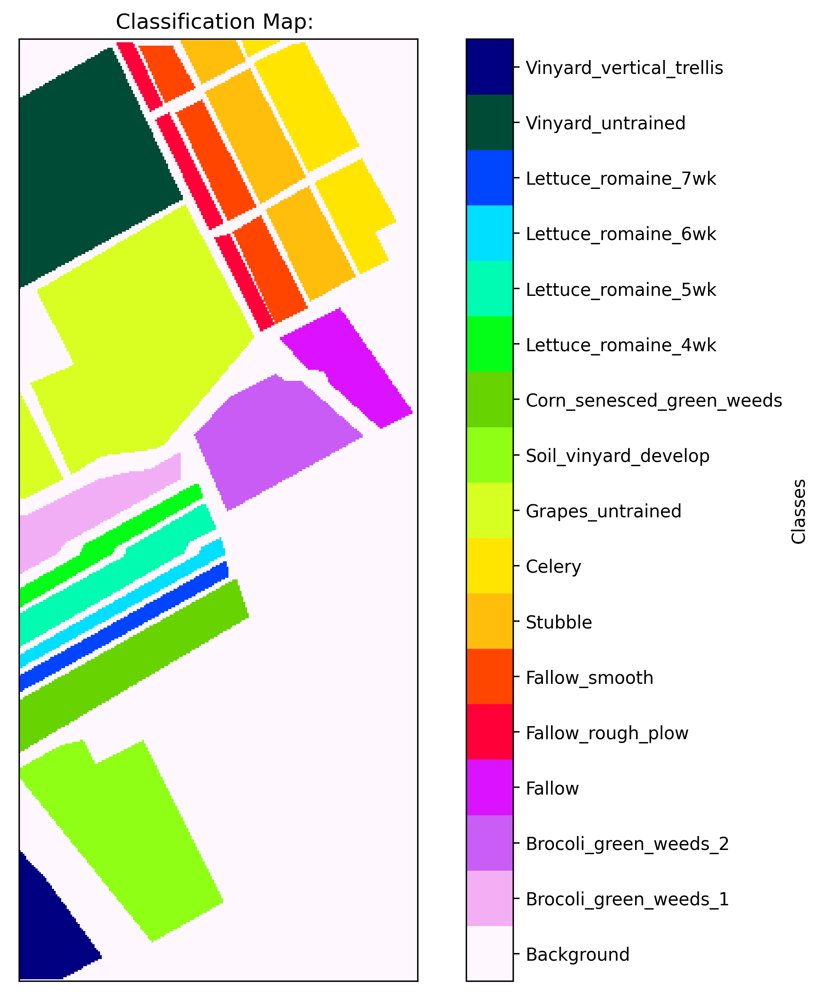

In [7]:
def display_class(data, title=''):
    '''
    NUMPY
    Displays Classification Map
    :param data: 2D Numpy array containing pixel wise labels
    :return: None
    '''
    fig, ax = plt.subplots()

    plt.imshow(data, cmap=cm.get_cmap('gist_ncar_r', NUM_CLASSES + 1))
    plt.title('Classification Map: ' + title)
    plt.setp(ax, xticks=[], yticks=[])
    cbar = plt.colorbar(label='Classes', boundaries=(np.arange(NUM_CLASSES + 2) - 0.5))
    cbar.set_ticks(np.arange(NUM_CLASSES + 1))
    cbar.set_ticklabels(GROUND_TRUTH)

    return None

display_class(np.reshape(inputLabel, IMG_DIM[: -1]))


**Preprocessing - 2 (Segmentation):** \
Recall that for unlabelled clustering we use image segmentation techniques to identify disjoint regions, with pixels in each region forming a densely connected graph. To demonstrate the effectiveness of segmentation algorithm when dealing with hyperspectral imagery we use two algorithms: _Watershed_ and _SLIC_. To prevent oversegmentation with SLIC, we use Region Adjacency Graph (RAG) to merge similar regions in the image.
We use Watershed segmentation for Salinas and SLIC + RAG for Pavia, Indian Pines 

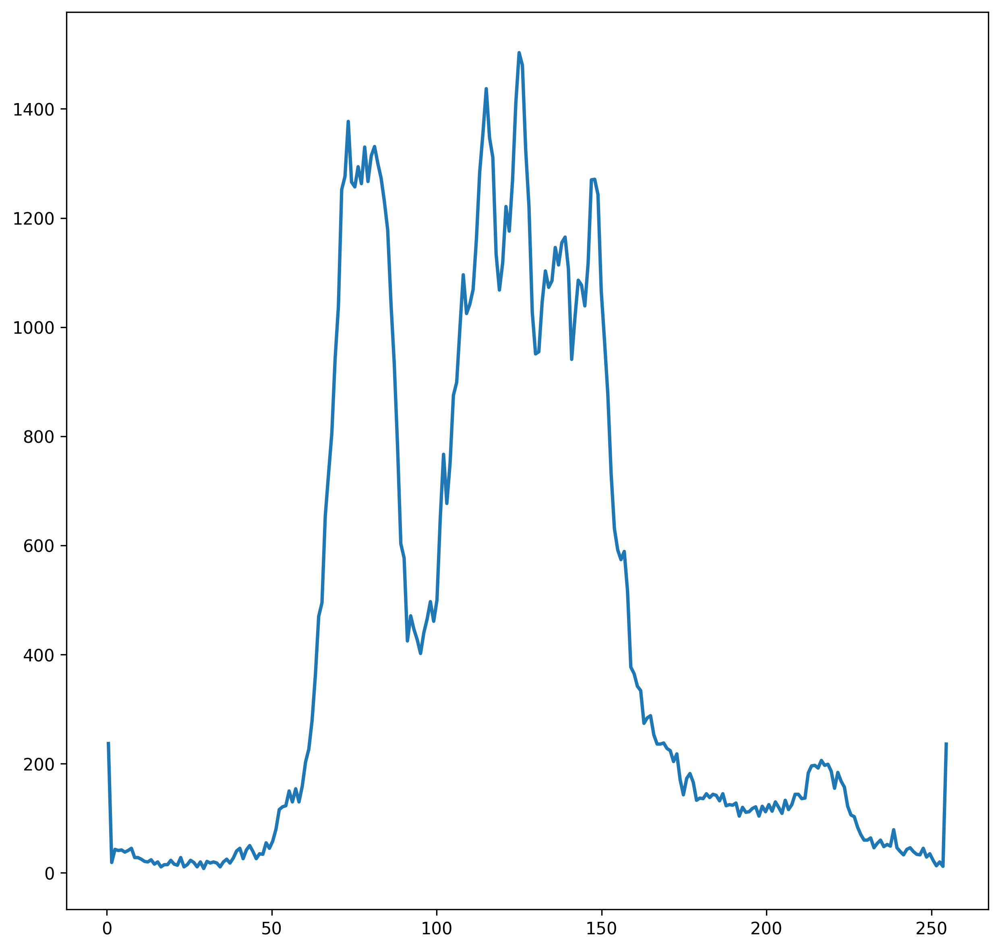

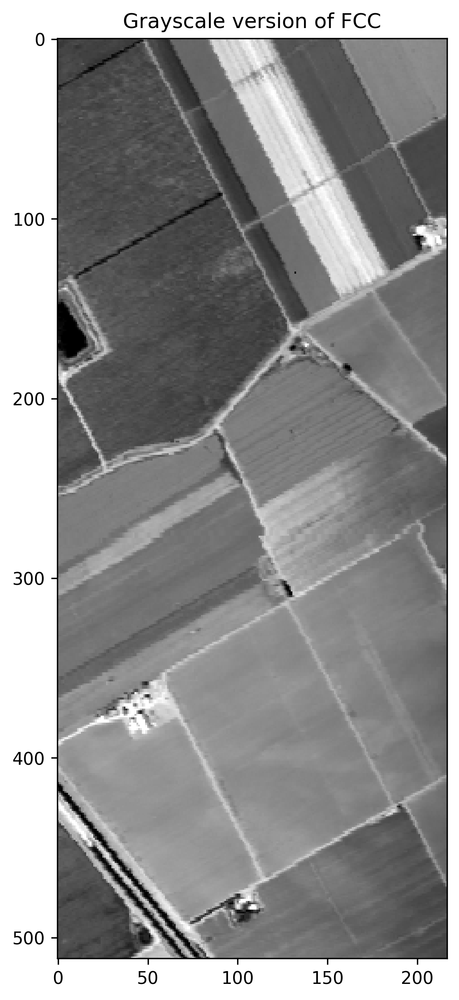

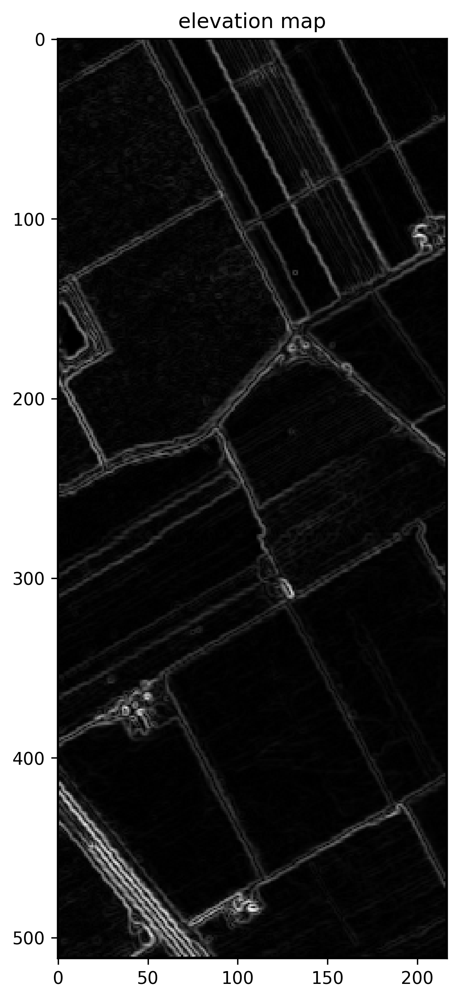

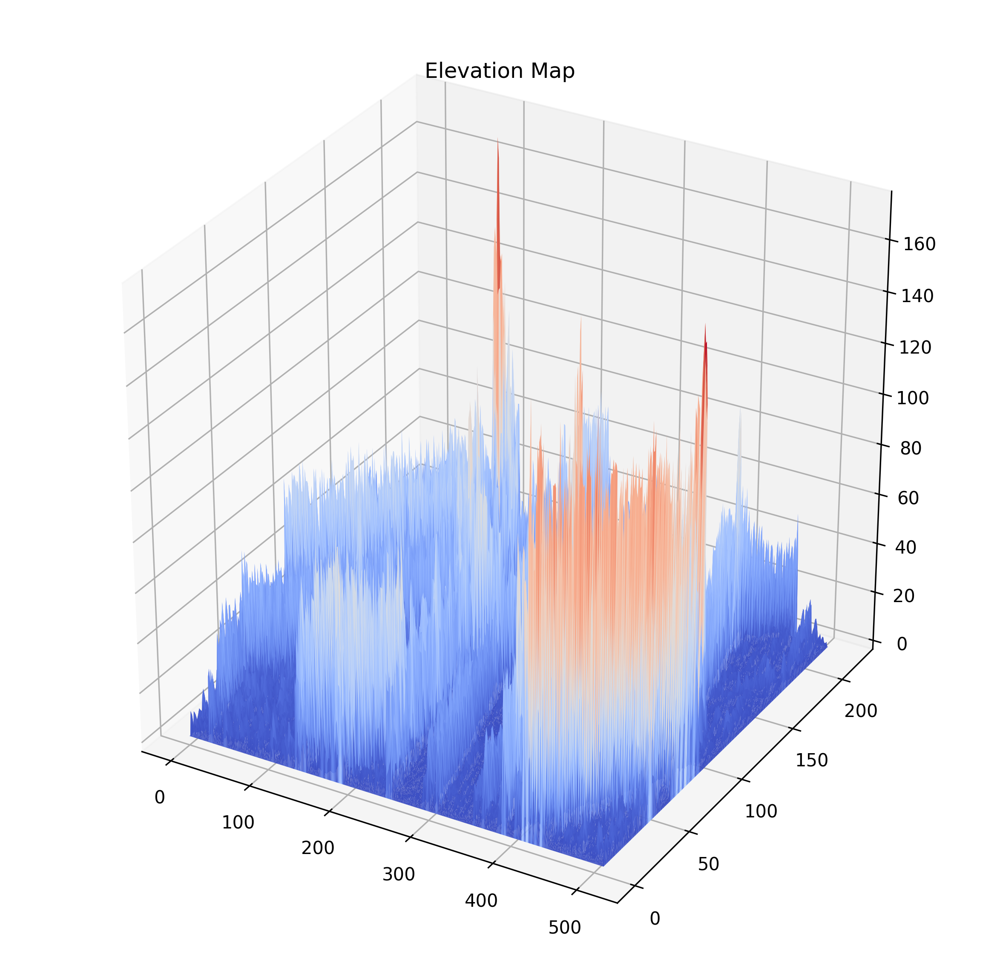

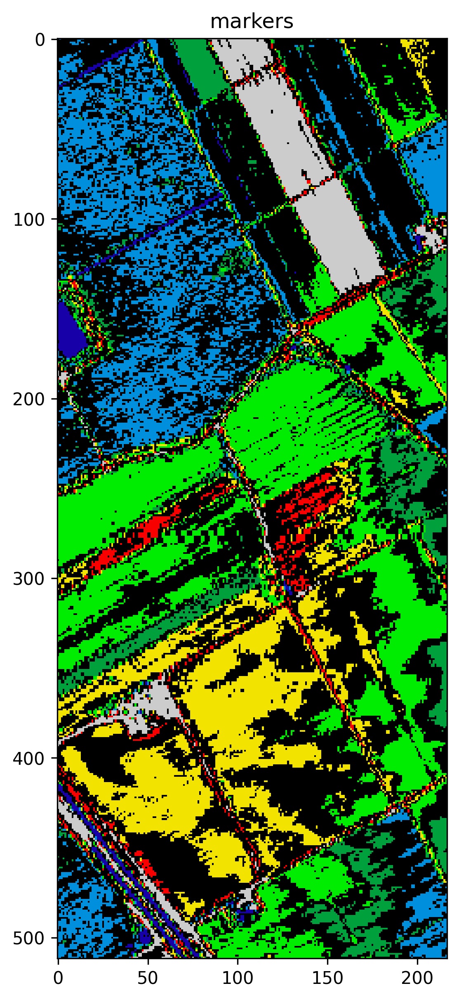

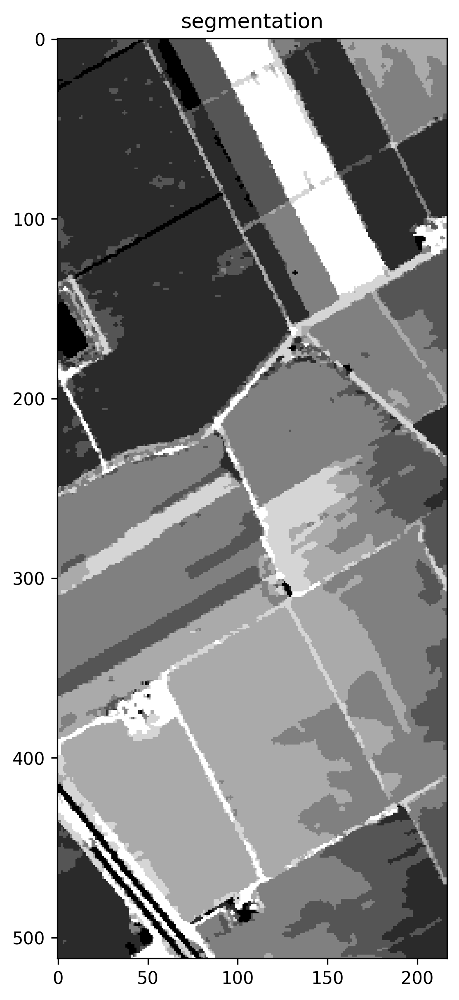

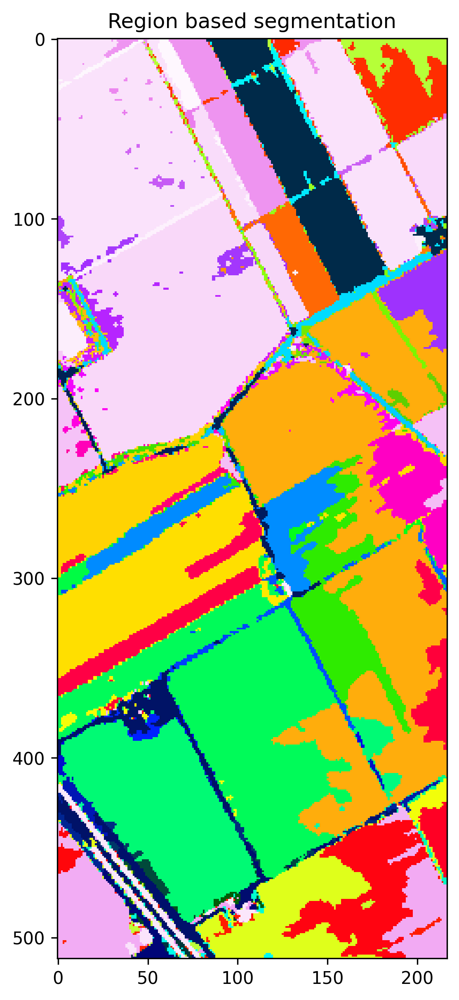

In [8]:
def segment_image(fcc, image_spectrum, display=False, indian_pines=False, salinas=False, pavia=False):
    '''
    Image Segmentation (Watershed algorithm + SLIC) and Region identification (Morphology)
    Reference: https://scikit-image.org/docs/dev/auto_examples/applications/plot_coins_segmentation.html
    :param fcc: (3D numpy array) False Color Composite
    :param image_spectrum: Hyperspectral data after standardization
    :param display: (bool) Display segmentation outputs
    :param indian_pines: (bool) Select Indian Pines dataset
    :param salinas: (bool) Select Salinas dataset
    :param pavia: (bool) Select Pavia dataset
    :return: (2D Numpy array) Segmentation output
    '''
    assert indian_pines + salinas + pavia == 1, "One of the three datasets needs to be selected"
    # Uses Watershed Algorithm
    if salinas:
        # Rescale the image after removing outliers from the grayscale image
        # Grayscale = 0.2125 * R + 0.7154 * G + 0.0721 * B, scaled to 255
        grayscale_img = color.rgb2gray(fcc)
        img_min, img_max = np.percentile(grayscale_img, (0.2, 99.8))
        grayscale_img = exposure.rescale_intensity(grayscale_img, in_range=(img_min, img_max))

        # Identify markers using visual cues from the Grayscale
        markers = np.zeros_like(grayscale_img)

        # Generate the elevation map using sobel filter
        grayscale_img = 255 * grayscale_img
        elevation_map = filters.sobel(grayscale_img)

        markers[grayscale_img < 40] = 1
        markers[(grayscale_img < 80) & (grayscale_img > 70)] = 2
        markers[(grayscale_img < 105) & (grayscale_img > 95)] = 3
        markers[(grayscale_img < 130) & (grayscale_img > 115)] = 4
        markers[(grayscale_img < 150) & (grayscale_img > 140)] = 5
        markers[(grayscale_img < 175) & (grayscale_img > 165)] = 6
        markers[grayscale_img > 200] = 7

        # Segment the image using waterscale algorithm
        segmentation = morphology.watershed(elevation_map, markers)

        # Convert region labels to one hot
        one_hot = np.zeros(segmentation.shape + (7,))
        for i in range(segmentation.shape[0]):
            for j in range(segmentation.shape[1]):
                one_hot[i, j, segmentation[i, j] - 1] = 1
        one_hot = one_hot.astype(np.uint8)
        tf.logging.debug('Segmentation Salinas: one_hot encoding is: ' + str(one_hot))

        # Labelling disjoint regions with unique IDs
        structure_elem = [[1, 1, 1], [1, 1, 1], [1, 1, 1]]

        label_offset = 0  # Next region starts numbering from this +1
        labeled_segmentation = np.zeros_like(segmentation)
        for i in range(one_hot.shape[-1]):
            container, _ = ndi.label(one_hot[:, :, i], structure=structure_elem)
            mask = container > 0
            mask = mask.astype(np.uint8)
            container = container + (label_offset * mask)  # Adds offset to region IDs to avoid clash
            label_offset = np.max(container)
            labeled_segmentation = labeled_segmentation + container

        if display:
            # Image histogram
            hist, hist_centers = histogram(grayscale_img)
            plt.figure()
            plt.plot(hist_centers, hist, lw=2)

            # Grayscale FCC
            plt.figure()
            plt.title('Grayscale version of FCC')
            plt.imshow(grayscale_img, cmap='gray')

            # Elevation Map 2D
            plt.figure()
            plt.imshow(elevation_map, cmap=plt.cm.gray, interpolation='nearest')
            plt.title('elevation map')

            # Elevation Map 3D
            # Similar to: https://stackoverflow.com/a/31806902
            x, y = np.mgrid[0:elevation_map.shape[0], 0:elevation_map.shape[1]]
            fig = plt.figure()
            ax = fig.gca(projection='3d')
            ax.plot_surface(x, y, elevation_map, rstride=1, cstride=1, linewidth=0, cmap=cm.coolwarm)
            ax.set_title('Elevation Map')

            # Markers
            plt.figure()
            plt.imshow(markers, cmap=plt.cm.nipy_spectral, interpolation='nearest')
            plt.title('markers')

            # Watershed Segmentation output
            plt.figure()
            plt.imshow(segmentation, cmap=plt.cm.gray, interpolation='nearest')
            plt.title('segmentation')

            # Disjoint region labelling output
            plt.figure()
            plt.imshow(labeled_segmentation, cmap=cm.get_cmap('gist_ncar_r', label_offset + 1))
            plt.title('Region based segmentation')

        return labeled_segmentation

    # Uses SLIC + RAG algorithm
    elif indian_pines:
        # Rescale according to standard deviation to use with PCA
        image_spectrum = np.multiply(image_spectrum, PIXEL_SD)

        # Computing PCA which will act as a 3-channel image to be used for segmentation
        pca = PCA(n_components=3)
        image_pca = pca.fit_transform(image_spectrum)

        # Rescale all three principal components to form image with no negative values
        pc0 = image_pca[:, 0].reshape([IMG_DIM[0], IMG_DIM[1], 1])
        pc0 = pc0 + np.min(pc0)
        pc0 = pc0 / np.max(pc0)
        img_min, img_max = np.percentile(pc0, (0.2, 99.8))
        pc0 = exposure.rescale_intensity(pc0, in_range=(img_min, img_max), out_range=(0, 1))

        pc1 = image_pca[:, 1].reshape([IMG_DIM[0], IMG_DIM[1], 1])
        pc1 = pc1 + np.min(pc1)
        pc1 = pc1 / np.max(pc1)
        img_min, img_max = np.percentile(pc1, (0.2, 99.8))
        pc1 = exposure.rescale_intensity(pc1, in_range=(img_min, img_max), out_range=(0, 1))

        pc2 = image_pca[:, 2].reshape([IMG_DIM[0], IMG_DIM[1], 1])
        pc2 = pc2 + np.min(pc2)
        pc2 = pc2 / np.max(pc2)
        img_min, img_max = np.percentile(pc2, (0.2, 99.8))
        pc2 = exposure.rescale_intensity(pc2, in_range=(img_min, img_max), out_range=(0, 1))

        fcc = np.concatenate((pc0, pc1, pc2), axis=2)

        # Compute SLIC regions
        labeled_segmentation = slic(fcc, n_segments=200, compactness=20, max_iter=5000)
        label_segment_overlay = color.label2rgb(labeled_segmentation, fcc, kind='avg')

        # Merges regions that are formed due to oversegmentation
        g = graph.rag_mean_color(image=fcc, labels=labeled_segmentation, connectivity=1)
        labels2 = graph.cut_threshold(labeled_segmentation, g, 0.1)
        final = color.label2rgb(labels2, fcc, kind='avg')

        if display:
            plt.figure()
            plt.imshow(fcc)
            plt.title('Top 3 Principal Components Stacked')

            plt.figure()
            plt.imshow(labels2, cmap=cm.get_cmap('gist_ncar_r'))
            plt.title('Labels')

            plt.figure()
            plt.imshow(label_segment_overlay, cmap=cm.get_cmap('gist_ncar_r'))
            plt.title('Region based segmentation')

            plt.figure()
            plt.imshow(final)
            plt.title('Final Segmentation Output')

        return labels2

    # Uses SLIC + RAG algorithm
    else:
        # Rescale according to standard deviation to use with PCA
        assert pavia, "No dataset selected"
        image_spectrum = np.multiply(image_spectrum, PIXEL_SD)

        # Computing PCA which will act as a 3-channel image to be used for segmentation
        pca = PCA(n_components=3)
        image_pca = pca.fit_transform(image_spectrum)

        # Rescale all three principal components to form image with no negative values
        pc0 = image_pca[:, 0].reshape([IMG_DIM[0], IMG_DIM[1], 1])
        pc0 = pc0 + np.min(pc0)
        pc0 = pc0 / np.max(pc0)
        img_min, img_max = np.percentile(pc0, (0.2, 99.8))
        pc0 = exposure.rescale_intensity(pc0, in_range=(img_min, img_max), out_range=(0, 1))

        pc1 = image_pca[:, 1].reshape([IMG_DIM[0], IMG_DIM[1], 1])
        pc1 = pc1 + np.min(pc1)
        pc1 = pc1 / np.max(pc1)
        img_min, img_max = np.percentile(pc1, (0.2, 99.8))
        pc1 = exposure.rescale_intensity(pc1, in_range=(img_min, img_max), out_range=(0, 1))

        pc2 = image_pca[:, 2].reshape([IMG_DIM[0], IMG_DIM[1], 1])
        pc2 = pc2 + np.min(pc2)
        pc2 = pc2 / np.max(pc2)
        img_min, img_max = np.percentile(pc2, (0.2, 99.8))
        pc2 = exposure.rescale_intensity(pc2, in_range=(img_min, img_max), out_range=(0, 1))

        fcc = np.concatenate((pc0, pc1, pc2), axis=2)

        # Compute SLIC regions
        labeled_segmentation = slic(fcc, n_segments=10000, compactness=0.1, max_iter=5000)
        label_segment_overlay = color.label2rgb(labeled_segmentation, fcc, kind='avg')

        # Merges regions that are formed due to oversegmentation
        g = graph.rag_mean_color(fcc, labeled_segmentation, connectivity=1)
        labels2 = graph.cut_threshold(labeled_segmentation, g, 0.065)
        final = color.label2rgb(labels2, fcc, kind='avg')

        if display:
            plt.figure()
            plt.imshow(fcc)
            plt.title('Top 3 Principal Components Stacked')

            plt.figure()
            plt.imshow(labels2, cmap=cm.get_cmap('gist_ncar_r'))
            plt.title('Labels')

            plt.figure()
            plt.imshow(label_segment_overlay, cmap=cm.get_cmap('gist_ncar_r'))
            plt.title('Region based segmentation')

            plt.figure()
            plt.imshow(final)
            plt.title('Final Segmentation Output')

        return labels2

segmented = segment_image(fcc, inputData, display=True, salinas=True)


**Preprocessing - 3:** \
Background class is removed from the dataset as well as segmented output.\
Re-number segmented region IDs to handle missing regions due to removing background.\
Split the dataset into train/test samples

In [9]:
def create_dataset(data, data_gt, segmented):
    '''
    NUMPY
    Removes background class present in Salinas / Indian Pines
    Random shuffling followed by split of the dataset into training and testing set
    :param data: 2D array (numpy) Hyperspectral Image
    :param data_gt: 1D array (numpy) Ground Truth labels
    :return: Training data and labels, Testing data and labels
    '''

    # Delete background class 0 from input and labels
    global INDEX_NO_CLASS
    to_delete = []
    for i in range(data_gt.shape[0]):
        if data_gt[i] == 0:
            to_delete.append(i)
    INDEX_NO_CLASS = to_delete
    data = np.delete(arr=data, obj=to_delete, axis=0)
    data_gt = np.delete(arr=data_gt, obj=to_delete, axis=0)

    # Delete background class 0 from segmented regions
    segmented = np.reshape(segmented, (-1,))
    segmented = np.delete(arr=segmented, obj=to_delete, axis=0)

    # Identify number of unique regions, also gives them continuous IDs
    # Post deleting background, some background regions would be missing. 
    # Therefore re-number the regions in an increasing order where all 
    # regions are numbered from 1 to NUM_REGIONS 
    region_index = {}
    global NUM_REGIONS
    NUM_REGIONS = 1
    for k in range(segmented.shape[0]):
        try:
            segmented[k] = region_index[segmented[k]]
        except KeyError:
            region_index[segmented[k]] = NUM_REGIONS
            segmented[k] = region_index[segmented[k]]
            NUM_REGIONS += 1

    print("Number of Unique regions:" + str(NUM_REGIONS))
    # Subtracted 1 so that indices for one-hot encoding start from 0 and not 1.
    data_gt = data_gt - 1

    tf.logging.info('\n\nShape of input data: ' + str(data.shape))
    tf.logging.info('\n\nShape of input GT: ' + str(data_gt.shape))

    global NUM_BANDS
    NUM_BANDS = data.shape[1]

    # Shuffle the data to form Training and Testing set
    data = np.concatenate((data, data_gt.reshape((-1, 1)),  segmented.reshape((-1, 1))), axis=1)
    # default shuffling is along axis=0 (rows)
    np.random.shuffle(data)
    bands = data[:, :-2]
    label = data[:, -2].astype(np.int32)
    segmented = data[:, -1].astype(np.int32)

    train_bands = bands[:round(TRAIN_SPLIT * bands.shape[0]), :]
    train_label = label[:round(TRAIN_SPLIT * label.shape[0])]
    train_seg = segmented[:round(TRAIN_SPLIT * label.shape[0])]
    test_bands = bands[round(TRAIN_SPLIT * bands.shape[0]):, :]
    test_label = label[round(TRAIN_SPLIT * label.shape[0]):]
    test_seg = segmented[round(TRAIN_SPLIT * label.shape[0]):]

    return train_bands, train_label, test_bands, test_label, train_seg, test_seg

(trainBands, trainLabels, testBands, testLabels, trainSeg, testSeg) = create_dataset(inputData, inputLabel, segmented)


Number of Unique regions:333
INFO:tensorflow:

Shape of input data: (54129, 204)
INFO:tensorflow:

Shape of input GT: (54129,)


Our samples, whose dimensions we are going to reduce, are the hyperspectral waveforms of the pixels comprising the image. 

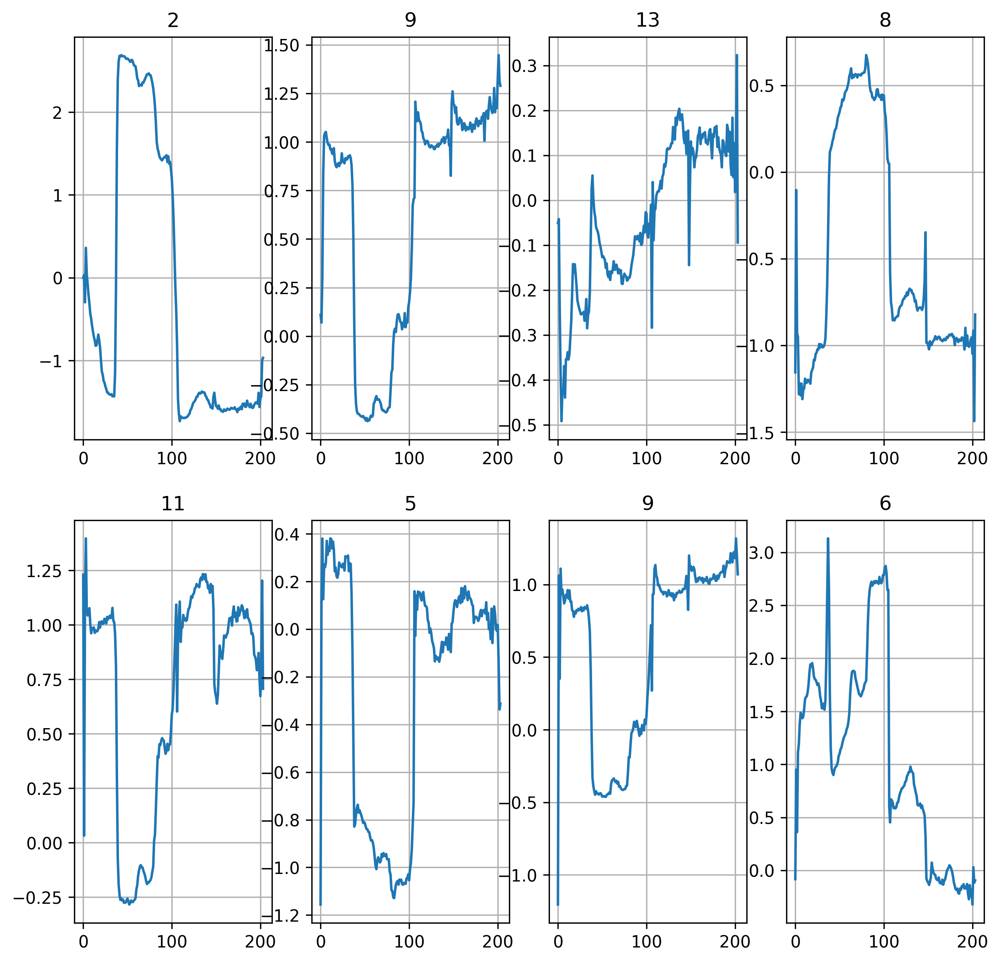

In [10]:
def display_pixel(data, label):
    '''
    NUMPY
    Displays Hyperspectral Band
    :param data: 3D array (numpy) of satellite image.
    :return: None
    '''
    plt.figure()
    subplot_index = 1
    for _ in range(1, 9):
        index = np.random.choice(data.shape[0])
        plt.subplot(2, 4, subplot_index)
        plt.plot(data[index])
        plt.title(str(label[index] + 1))
        subplot_index += 1
        plt.grid()
    plt.show()
    
    return None

display_pixel(trainBands, trainLabels)


**Preprocessing-4:** \
Our final step in the data pipeline consists of transforming the dataset into a tensorflow compatible data structure.

In [0]:
def dataset_tf(bands, labels, train=True):
    '''
    TENSORFLOW
    Creates a TensorFlow dataset object which is given as input to the Estimator object
    Converts the labels into one-hot encoded targets.
    :param bands: 2D array (numpy) of hyperspectral image bands
    :param labels: 1D array (numpy) of labels corresponding to bands
    :param train: boolean (True) If true, dataset repeats for NUM_EPOCHS, no repeatation otherwise (prediction phase)
    :return: TensorFlow Dataset object
    '''

    with tf.variable_scope("Dataset_Batches"):
        # Dataset dimensions should be (NUM_BANDS, 1) as tf.layers.conv1d() requires channel depth to be known
        # Labels are converted to one_hot inside classification_loss (LEt_SNE function)
        band_dataset = tf.data.Dataset.from_tensor_slices((bands, labels)).map(lambda x, y: (tf.reshape(x, (-1, 1)), y))
        if train:
            band_dataset = band_dataset.shuffle(100000).repeat(NUM_EPOCHS).batch(BATCH_SIZE, drop_remainder=True)
        else:
            band_dataset = band_dataset.batch(BATCH_SIZE)
        tf.logging.info('Batches created')
        tf.logging.info('1. Dataset element \nType: %s \nShape: %s',
                        str(band_dataset.output_types),
                        str(band_dataset.output_shapes))
        return band_dataset


## Part 4: Defining LEt-SNE

For a detailed description of the algorithm, please refer to the published paper.
The various components that form the core of LEt-SNE are:
- Multilayer Perceptron
- Laplacian Eigenmaos
- t-SNE
- Compression Factor
- KL Divergence

1. The initial step involves the forward propagation of samples along the neural network given as $\mathcal{Y} = f(\mathcal{X}, w)$.
2. We then compute the distance matrix for $\mathcal{X}$ and $\mathcal{Y}$.
3. The adjacency matrix is computed based on the (i) distance matrix, if mode of operation is _Manifold_, (ii) based on labels if we are clustering with labels, and (iii) region segmentation if clustering without labels.
4. Using the adjacency matrix obtained above, we compute the graph Laplacian, which is used to minimize the Laplacian Eigenmap term.
5. Based on the distance matrix and compression factor ($\mathcal{C}\mathcal{F}$), we compute the neighbourhood probability matrices $p$ for the original samples ($\mathcal{X}$) and $q$ for the reduced samples ($\mathcal{Y}$). This step is common with the Stochastic Neighbourhood Encoding algorithm.
6. Based upon the mode of operation, either we compute the KL divergence KL(p||q) or KL(q||p).
7. Finally, we combine the laplacian objective and the KL divergence to frame the final minimization metric $\mathcal{Y}^TL\mathcal{Y}\,+\,\lambda*KL(p, q)$

In [0]:
def let_sne(features, labels, mode, params):
    '''
    TENSORFLOW
    This acts as model function which is provided to object of Estimator class
    The model consists of an autoencoder and a LINEAR classification branch, which
    originates from the hidden layer representation. We include a linear branch
    to guide the network to learn linearly separable lower dimensional representation
    of the input space. Thus, class labels are used to learn encoding of the bands.
    :param features: A 2D tensor of size [BATCH_SIZE, NUM_BANDS]; input to the network
    :param labels: A 2D tensor of size [BATCH_SIZE, NUM_CLASSES]; one-hot representation of the labels
    :param mode: (tf.keys) Predict, Evaluate, Train. Value depends on the keys passed to the estimator
    :param params: Dictionary, consisting of the number of hidden nodes, and the ratio of the losses
    :return: tf.estimator.EstimatorSpec() object, return value depends on the ModeKeys used to call the estimator.
    '''

    def model(input_features, bn_train):
        '''
        1-D convolutional autoencoder with weight regularization for the decoder and classification layers.
        :param input_features: A 3D tensor of size [BATCH_SIZE, NUM_BANDS, 1]; input to the network
        :return: 1. encoder: A 2D tensor of size [BATCH_SIZE, DIM_REDUCED]; lower dimension encoding of data
                 2. decoder: A 2D tensor of size [BATCH_SIZE, NUM_BANDS]; reconstruction from the encoder_bands
                 3. weights_encoder: A 2D tensor of size [HIDDEN[0] , HIDDEN[1]], linear mapping to the embedding
        '''

        with tf.variable_scope("LEt_SNE"):
            # We do not use convolutional features to provide a fair comparison with other approaches.
            # However, convolutional feature extraction should provide superior results over the Fully Connected variant
            input_features_flat = tf.layers.Flatten()(input_features)
            encoder_mid = tf.layers.Dense(units=64, activation=None,
                                          name='encoder_mid')(input_features_flat)
            batch_norm_1 = tf.nn.relu(tf.layers.batch_normalization(inputs=encoder_mid, momentum=0.99, epsilon=1e-5,
                                                                    name="batch_norm_1", training=bn_train))
            encoder = tf.layers.Dense(units=params['hidden'][0], activation=None,
                                      name='encoder')(batch_norm_1)

        with tf.variable_scope("LEt_SNE/Reconstruction"):
            # Decoder network
            decoder_mid = tf.nn.relu(tf.layers.Dense(units=64,
                                                     name='decoder_mid',
                                                     kernel_regularizer=l2_reg(scale=LOSS_REGULARIZATION))(encoder))
            decoder = tf.layers.Dense(units=NUM_BANDS,
                                      name='decoder',
                                      kernel_regularizer=l2_reg(scale=LOSS_REGULARIZATION))(decoder_mid)

        graph = tf.get_default_graph()
        p = graph.get_operations()
        tf.logging.debug('\nGlobal Variables: ' + str(tf.get_collection(tf.GraphKeys.GLOBAL_VARIABLES)))
        tf.logging.debug("Graph operations: " + str(p[-1].values()) + "\n")
        tf.summary.histogram('encoder', graph.get_tensor_by_name('LEt_SNE/encoder/kernel:0'))
        tf.summary.histogram('decoder', graph.get_tensor_by_name('LEt_SNE/Reconstruction/decoder/kernel:0'))

        # Plot the l2-norm for debugging purposes
        encode_tensor = graph.get_tensor_by_name('LEt_SNE/encoder/BiasAdd:0')
        encode_l2_norm = tf.reduce_mean(tf.norm(encode_tensor, ord='euclidean', axis=1))
        tf.summary.scalar('Encoding_l2_norm', encode_l2_norm)
        if params['convolution']:
            batch_norm_2_tensor = graph.get_tensor_by_name('LEt_SNE/batch_norm_2/batchnorm/add_1:0')
            bn_2_l2_norm = tf.reduce_mean(tf.norm(batch_norm_2_tensor, ord='euclidean', axis=1))
            tf.summary.scalar('BatchNorm_2_l2_norm', bn_2_l2_norm)

        weights_encoder = graph.get_tensor_by_name('LEt_SNE/encoder/kernel:0')

        return encoder, decoder, weights_encoder

    def graph_distance(input_features):
        '''
        Computes the pairwise SQUARED distance between 2 samples in the mini-batch.
        This is given by D[i,j] = (a[i]-a[j])(a[i]-a[j])', which simplifies to D = r - 2 A A' + r' in the matrix form.
        Similar to https://stackoverflow.com/a/37040451
        :return: (BATCH_SIZE x BATCH_SIZE) Tensor containing pairwise distance between the samples.
        '''
        # Similar to https://stackoverflow.com/a/37040451
        with tf.name_scope("Graph_Distance"):

            input_features = tf.layers.Flatten()(input_features)
            feature_square_l2 = tf.reduce_sum(input_features * input_features, 1)
            feature_square_l2 = tf.reshape(feature_square_l2, [-1, 1])
            feature = tf.reshape(input_features, [BATCH_SIZE, -1])
            dist = feature_square_l2 - (2 * tf.matmul(feature, tf.transpose(feature))) + tf.transpose(feature_square_l2)

            return dist

    def permutation(indices):
        '''
        Genrates all possible input permutations, taken two at a time: nP2
        :param indices: 1D Tensor, contains indices of samples having same class
        :return: 2D Tensor, returns permutations.
        '''
        with tf.name_scope('Permutation'):
            # Similar to https://stackoverflow.com/a/48225468
            tile_a = tf.tile(tf.expand_dims(indices, 1), [1, tf.shape(indices)[0]])
            tile_a = tf.expand_dims(tile_a, 2)
            tile_b = tf.tile(tf.expand_dims(indices, 0), [tf.shape(indices)[0], 1])
            tile_b = tf.expand_dims(tile_b, 2)
            cart = tf.concat([tile_a, tile_b], axis=2)
            cart = tf.reshape(cart, [-1, 2])
            return cart

    def graph_adjacency(input_features):
        '''
        Computes the adjacency matrix of the graph by connecting the K Nearest neighbours to the sample.
        The adjacency matrix is symmetric in nature, computes element-wise maximum of Adj_Matrix and Adj_Matrix_T
        :param input_features: (3D Tensor) input to the model
        :return: (BATCH_SIZE x BATCH_SIZE) Tensor which is the Adjacency matrix
        '''
        with tf.name_scope("Adjacency"):
            if NUM_NEIGHBOURS:
                # Compute adjacency using euclidean nearest neigbours
                tf.logging.info("Computing Graph Laplacian using k-Nearest Neighbours")
                distance_matrix = graph_distance(input_features)

                # Similar to https://stackoverflow.com/a/49966843
                values, index = tf.math.top_k(input=(-1 * distance_matrix), k=(NUM_NEIGHBOURS + 1), sorted=True)
                index_one_hot = tf.one_hot(index, depth=BATCH_SIZE)
                index_reduced = tf.reduce_sum(index_one_hot, axis=-2)
                index = tf.where(tf.not_equal(index_reduced, 0))

                adjacency_matrix = tf.scatter_nd(indices=index,
                                                 updates=tf.ones([(NUM_NEIGHBOURS + 1) * BATCH_SIZE]),
                                                 shape=(BATCH_SIZE, BATCH_SIZE),
                                                 name='Graph_Adjacency_kNN')

                return tf.maximum(adjacency_matrix, tf.transpose(adjacency_matrix))

            else:
                # Compute adjacency using LABEL or SEGMENTATION information
                tf.logging.info("Computing Graph Laplacian using class labels")

                # We split up the labels into segments, each having the same label
                graph_labels = tf.reshape(labels, [-1])
                graph_index = tf.argsort(graph_labels, axis=0)
                graph_labels_sort = tf.sort(graph_labels)
                _, __, graph_count = tf.unique_with_counts(graph_labels_sort)
                # There is a small chance that the mini batch may have some classes absent.
                # Since TensorFlow has static graph, we pad the missing classes with '0'.
                # NOTE: We do not know which classes are missing. Our algorithm splits labels having same class.
                if SEGMENTATION:
                    padding = tf.constant(NUM_REGIONS) - tf.shape(graph_count)[0]
                else:
                    assert LABEL, "Segmentation and Label both are False"
                    padding = tf.constant(NUM_CLASSES) - tf.shape(graph_count)[0]
                count_pad = tf.pad(graph_count, [[0, padding]])
                # Split_indices returns a list containing Tensors, thus we can use python map, since we are mapping
                # elements of list to function, and not elements of tensor to function.
                if SEGMENTATION:
                    split_indices = tf.split(graph_index, count_pad, num=NUM_REGIONS)
                else:
                    split_indices = tf.split(graph_index, count_pad, num=NUM_CLASSES)

                # Label argmax are split into tensors of indices having same class.
                # Generate nP2 combinations of indices that denote pointers in the adjacency matrix; which are connected
                graph_connected_indices = list(map(permutation, split_indices))
                graph_connected_indices = tf.concat(graph_connected_indices, axis=0)
                # The shape of graph_connected_indices will defer from batch to batch; which isn't allowed in TensorFlow
                # Eg: Batch having one class: shape = BATCH_SIZE ** 2
                #     Batch having two class (equal): shape = 2(((BATCH_SIZE) / 2) ** 2)
                # Thus we pad this tensor by BATCH_SIZE ** 2 (which is max possible length of the tensor)and truncate it
                # Value for padding is chosen as BATCH_SIZE
                graph_connected_indices = tf.pad(tensor=graph_connected_indices,
                                                 paddings=[[0, (BATCH_SIZE ** 2)], [0, 0]],
                                                 constant_values=BATCH_SIZE)  # pad along rows
                graph_connected_indices = graph_connected_indices[:(BATCH_SIZE ** 2), :]

                adjacency_matrix = tf.scatter_nd(indices=graph_connected_indices,
                                                 updates=tf.ones([BATCH_SIZE ** 2]),
                                                 shape=(BATCH_SIZE + 1, BATCH_SIZE + 1),
                                                 name='Graph_Adjacency_Classes')
                corrected_adjacency = adjacency_matrix[:BATCH_SIZE, :BATCH_SIZE]

                if LOG_TENSOR[0]:
                    global LOG_TENSOR_DICT
                    LOG_TENSOR_DICT["Graph_Adjacency"] = corrected_adjacency

                return corrected_adjacency

    def graph_laplacian(input_features):
        '''
        Computes the Graph Laplacian L = D - A where L is the Laplacian, D is the degree of the graph, A is adjacency
        :param input_features: (3D Tensor) input to the model
        :return: (BATCH_SIZE x BATCH_SIZE) Tensor which is the Laplacian matrix
        '''
        with tf.variable_scope("Laplacian", reuse=False):
            adjacency = graph_adjacency(input_features)
            degree = tf.linalg.diag(tf.reduce_sum(adjacency, -1))
            laplacian = degree - adjacency

            adjacency = tf.stop_gradient(adjacency)
            degree = tf.stop_gradient(degree)
            laplacian = tf.stop_gradient(laplacian)

            return laplacian, degree, adjacency

    def kl_divergence(num, den):
        '''
        Computes the KL divergence between two distributions A and B
        :param a: 2D-Tensor; First probability distribution
        :param b: 2D-Tensor; Second probability distribution
        :return: Scalar; The KL divergence between a and b
        '''
        kl = tf.math.reduce_sum(tf.multiply(num, tf.log(tf.divide(num, den))))
        return kl

    def shannon_entropy(probs_array):
        '''
        Computes the Shannon Entropy for a distribution
        :param probs_array: 2D-Tensor; Probability distribution along axis=1
        :return: Scalar; H(p)
        '''
        h_shannon = tf.cast(tf.reduce_sum(-probs_array * (tf.log(probs_array)), axis=1), dtype=tf.float32)
        return h_shannon

    def js_divergence(probs_array):
        '''
        Computes the JS divergence between the compressed representation of the neurons
        Our goal is to maximize the divergence causing every neuron to encode
        different information from the rest.
        :param probs_array: (BARCH_SIZE x DIM_REDUCED) representation of hidden neurons
        :return: Scalar; JS divergence between the bands
        '''
        # Convert them to probability values, all elements in P_array are +ve due to sigmoid activation
        normalizer = tf.reduce_sum(probs_array, axis=0)
        probs_normalized = probs_array / normalizer

        probs_mean = tf.reduce_mean(probs_normalized, axis=1)

        # Index to access individual neurons in the hidden layer
        i = tf.constant(0)
        # Tensor to store the accumulated value of individual hidden neuron entropy
        entropy_sum = tf.constant(0.0, dtype=tf.float32)

        # Iterate over all the hidden bands
        def loop_condition(i, entropy_sum):
            return tf.less(i, DIM_REDUCED)

        # Parallel accumulation of individual band entropy into entropy_sum
        def loop_body(i, entropy_sum):
            entropy_sum = entropy_sum + shannon_entropy(probs_normalized[:, i])
            return i + 1, entropy_sum

        _, entropy_sum_while = tf.while_loop(loop_condition, loop_body, [i, entropy_sum], back_prop=True)
        js = shannon_entropy(probs_mean) - (entropy_sum_while / DIM_REDUCED)
        return js

    def p_conditional(pairwise_dist, adjacency):
        '''
        Computes P(j|i) using Binary Search
        :param pairwise_dist: (2D Tensor) pairwise distances between samples
        :return: 2D Tensor containing conditional probabilities
        '''
        # Estimating P i|j in the original space
        with tf.variable_scope('P_ij_conditional'):
            lower = tf.zeros([BATCH_SIZE])
            upper = 500 * tf.ones([BATCH_SIZE])
            pair_dist_neg = -pairwise_dist
            perplexity = PERPLEXITY * tf.ones([BATCH_SIZE])

            def calc_probs_perp(lower_bound, upper_bound):
                with tf.variable_scope('t-SNE/calc_perplexity'):
                    # Binary search
                    sigmas = (lower_bound + upper_bound) / 2
                    variance = tf.reshape(tf.square(sigmas), [-1, 1])
                    scaled_pair_dist_neg = tf.divide(pair_dist_neg, 2 * variance)
                    probs_unnormalized = tf.math.exp(scaled_pair_dist_neg)

                    # probability of point choosing itself as neighbour ~ 0
                    probs_unnormalized = tf.matrix_set_diag(probs_unnormalized, tf.zeros([BATCH_SIZE]))
                    softmax = tf.divide(probs_unnormalized, tf.reduce_sum(probs_unnormalized, axis=1, keepdims=True))

                    # clipping to avoid NaN values during entropy computation
                    softmax_clip = tf.clip_by_value(softmax, clip_value_min=1e-15, clip_value_max=1.)

                    entropy = shannon_entropy(softmax_clip)
                    perplexity_hat = tf.math.pow(2 * tf.ones([BATCH_SIZE]), entropy)

                    return perplexity_hat, softmax_clip

            perplexity_initial, probs = calc_probs_perp(lower, upper)

            def cond(_, __, perplexity_hat, ___):
                mask = tf.math.less(tf.abs(perplexity_hat - perplexity), TOLERANCE * tf.ones([BATCH_SIZE]))
                return tf.math.logical_not(tf.reduce_all(mask))

            def body(upper, lower, estimate_perplexity, _):
                # tf.cast(): True --> 1    False --> 0
                mask_gt = tf.math.greater(estimate_perplexity, perplexity)
                mask_gt = tf.cast(mask_gt, tf.float32)
                upper_update = upper - tf.multiply(mask_gt, (upper - lower) / 2)

                mask_lt = tf.math.less(estimate_perplexity, perplexity)
                mask_lt = tf.cast(mask_lt, tf.float32)
                lower_update = lower + tf.multiply(mask_lt, (upper - lower) / 2)

                upper = upper_update
                lower = lower_update

                perplexity_hat, probs = calc_probs_perp(lower, upper)

                return upper, lower, perplexity_hat, probs

            # Keeps computing till all values converge with the tolerance limit for perplexity or max iter reached
            lower_bound, upper_bound, perplexity_hat, probs_while = tf.while_loop(cond=cond,
                                                                                  body=body,
                                                                                  loop_vars=(upper,
                                                                                             lower,
                                                                                             perplexity_initial,
                                                                                             probs),
                                                                                  parallel_iterations=1,
                                                                                  maximum_iterations=1000)

            if LOG_TENSOR[1]:
                global LOG_TENSOR_DICT
                LOG_TENSOR_DICT["Perplexity"] = perplexity_hat

            # Compressing space around a point by boosting probability values of neighbours having same class
            if COMPRESSION_FACTOR != 1:
                probs_while = tf.matrix_set_diag(probs_while, tf.zeros([BATCH_SIZE]))
                probs_while = tf.multiply(probs_while, ((COMPRESSION_FACTOR - 1) * adjacency) + 1)
                probs_while = tf.divide(probs_while, tf.reduce_sum(probs_while, axis=1, keepdims=True))
                probs_while = tf.clip_by_value(probs_while, clip_value_min=1e-15, clip_value_max=1.)
            probs_while = tf.stop_gradient(probs_while)
            return probs_while

    def q_conditional(pairwise_dist, cauchy_dist=True, gaussian_dist=False):
        '''
        Computes Q(j|i) using Binary Search
        :param pairwise_dist: (2D Tensor) pairwise distances between samples
        :return: 2D Tensor containing conditional probabilities
        '''
        # Estimating Q i|j in the latent space
        with tf.variable_scope('Q_ij_conditional'):
            if cauchy_dist:
                cauchy = 1 + pairwise_dist
                cauchy = tf.math.pow(x=cauchy, y=(-1 * tf.ones([BATCH_SIZE, BATCH_SIZE])))
                cauchy = tf.matrix_set_diag(cauchy, tf.zeros([BATCH_SIZE]))
                cauchy = tf.divide(cauchy, tf.reduce_sum(cauchy, axis=1, keepdims=True))
                cauchy_clip = tf.clip_by_value(cauchy, clip_value_min=1e-15, clip_value_max=1.)
                return cauchy_clip

            if gaussian_dist:
                pair_dist_neg = -pairwise_dist
                variance = 1 * tf.ones(shape=[BATCH_SIZE, 1])
                scaled_pair_dist_neg = tf.divide(pair_dist_neg, 2 * variance)
                probs_unnormalized = tf.math.exp(scaled_pair_dist_neg)

                # probability of point choosing itself as neighbour ~ 0
                probs_unnormalized = tf.matrix_set_diag(probs_unnormalized, tf.zeros([BATCH_SIZE]))
                softmax = tf.divide(probs_unnormalized, tf.reduce_sum(probs_unnormalized, axis=1, keepdims=True))

                # clipping to avoid NaN values during entropy computation
                softmax_clip = tf.clip_by_value(softmax, clip_value_min=1e-15, clip_value_max=1.)
                return softmax_clip

    def inv_tsne(input_features, embedding, adjacency):
        '''
        KL(p||q) for manifold, KL(q|p) for segmentation + labelling
        :param input_features: (3D Tensor) input batch
        :param embedding: (3D Tensor) network output
        :param adjacency: (2D Tensor) Adjacency map
        :return: (scalar Tensor) KL Divergence
        '''
        # Eliminates extra dimension introduced by Conv1D
        # input_features = tf.layers.Flatten()(input_features)

        # Computes the pairwise distance between samples in the original and reduced space
        input_l2_pair = graph_distance(input_features)
        embedding_l2_pair = graph_distance(embedding)

        if LOG_TENSOR[2]:
            global LOG_TENSOR_DICT
            LOG_TENSOR_DICT["Embedding_l2_pair"] = embedding_l2_pair

        probs_p = p_conditional(tf.cast(input_l2_pair, dtype=tf.float32), adjacency)
        probs_q = q_conditional(embedding_l2_pair, cauchy_dist=True)

        if MANIFOLD:
            kl_p_q = kl_divergence(num=probs_p, den=probs_q)
            return kl_p_q
        else:
            kl_q_p = kl_divergence(num=probs_q, den=probs_p)
            return kl_q_p

    if mode == tf.estimator.ModeKeys.TRAIN:
        (embedding, reconstruction, weights_encoder) = model(input_features=features, bn_train=True)
    else:
        (embedding, reconstruction, weights_encoder) = model(input_features=features, bn_train=False)

    # Compute predictions.
    with tf.variable_scope("LEt_SNE/Prediction"):
        if mode == tf.estimator.ModeKeys.PREDICT:
            predictions = {'encoded': embedding}

            return tf.estimator.EstimatorSpec(mode, predictions=predictions)

    with tf.variable_scope("LEt_SNE/Losses"):

        embedding = tf.cast(embedding, dtype=tf.float32)

        # Loss as defined by the Laplacian Eigenmaps
        laplacian, degree, adjacency = graph_laplacian(input_features=features)
        loss_laplacian = tf.trace(tf.matmul(tf.matmul(tf.transpose(embedding), laplacian), embedding))

        # Loss for Reconstruction (Autoencoder)
        loss_reconstruction = tf.cast(
            tf.losses.mean_squared_error(labels=features,
                                         predictions=tf.reshape(reconstruction, [-1, NUM_BANDS, 1]),
                                         reduction=tf.losses.Reduction.SUM),
            dtype=tf.float32)

        # Modified t-SNE loss
        loss_inv_tsne = inv_tsne(features, embedding, adjacency)

        total_loss = tf.convert_to_tensor([loss_laplacian, loss_inv_tsne, loss_reconstruction])

        if LOG_TENSOR[3]:
            global LOG_TENSOR_DICT
            LOG_TENSOR_DICT["Encoding"] = embedding

        tf.summary.scalar('Laplacian_loss', loss_laplacian * params['loss_weights'][0])
        tf.summary.scalar('Inverse_tSNE_loss', loss_inv_tsne * params['loss_weights'][1])
        tf.summary.scalar('Reconstruction_loss', loss_reconstruction * params['loss_weights'][2])

    with tf.variable_scope("LEt_SNE/Train"):
        optimizer = tf.train.AdamOptimizer(learning_rate=LEARNING_RATE, name='Adam')
        loss = tf.reduce_sum(tf.multiply(params['loss_weights'], total_loss))
        train = optimizer.minimize(loss=loss,
                                   global_step=tf.train.get_or_create_global_step(),
                                   name='Adam_minimizer')
        if mode == tf.estimator.ModeKeys.TRAIN:
            update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
            with tf.control_dependencies(update_ops):
                loss = tf.identity(loss)
            if True in LOG_TENSOR:
                logging_hook = tf.train.LoggingTensorHook(LOG_TENSOR_DICT, every_n_iter=500)
                return tf.estimator.EstimatorSpec(mode, loss=loss, train_op=train, training_hooks=[logging_hook])
            else:
                return tf.estimator.EstimatorSpec(mode, loss=loss, train_op=train)


We define a new function to obtain predictions from LEt-SNE custom estimator

In [0]:
def predictor(bands, labels, model, type):
    '''
    NUMPY AND TENSORFLOW
    '''
    assert type == 'encoded', "Choose valid Prediction"
    generator = model.predict(input_fn=lambda: dataset_tf(bands, labels, train=False))
    prediction = np.empty(shape=(0, DIM_REDUCED), dtype=np.float32)
    while True:
        try:
            prediction = np.append(prediction,
                                   np.reshape(next(generator)[type], [1, -1]),
                                   axis=0)
        except StopIteration:
            break
    assert prediction.shape[0] == bands.shape[0], "Predictions not present for all bands"
    return prediction


## Part 5: Comparison with other algorithms

To better understand and evaluate LEt-SNE, we compare our approach with popular and state-of-the-art approaches. These include t-SNE, UMAP, Autoencoders, LDA and PCA

In [0]:
def principal_componenet_analysis(train, test, n_components, image):
    '''
    NUMPY
    Compute the principal component transform of the entire dataset
    :param train: Numpy 2D array containing the entire Training Data
    :param test: Numpy 2D array containing the entire Testing Data
    :param n_components: Number of components to retain
    :return: Principal Component Transform of Training and Testing Data
    '''
    # De-standardizing data, such that Mean = 0 and Variance remanins what the original values were
    train = np.multiply(train, PIXEL_SD)
    test = np.multiply(test, PIXEL_SD)
    image = np.multiply(image, PIXEL_SD)

    pca = PCA(n_components=n_components)
    pca.fit(train)
    train_pca = pca.transform(train)
    test_pca = pca.transform(test)
    image_pca = pca.transform(image)
    assert train_pca.shape[1] == n_components, "Check PCT dimensions"
    return train_pca, test_pca, image_pca


def linear_discriminant_analysis(train, test, n_components, image, labels):
    '''
    NUMPY
    Compute the principal component transform of the entire dataset
    :param train: Numpy 2D array containing the entire Training Data
    :param test: Numpy 2D array containing the entire Testing Data
    :param n_components: Number of components to retain
    :return: Principal Component Transform of Training and Testing Data
    '''
    if LABEL:
        # De-standardizing data, such that Mean = 0 and Variance remains what the original values were
        train = np.multiply(train, PIXEL_SD)
        test = np.multiply(test, PIXEL_SD)
        image = np.multiply(image, PIXEL_SD)

        lda = LDA(n_components=n_components)
        lda.fit(X=train, y=labels)
        train_lda = lda.transform(train)
        test_lda = lda.transform(test)
        image_lda = lda.transform(image)
        assert train_lda.shape[1] == n_components, "Check PCT dimensions"
        return train_lda, test_lda, image_lda
    else:
        raise ValueError("LDA works only when LABEL is True")


def umap_fn(train, test, label, n_components, image):
    '''
    NUMPY
    https://umap-learn.readthedocs.io/en/latest/how_umap_works.html
    Compute the UMAP transform of the entire dataset
    :param train: Numpy 2D array containing the entire Training Data
    :param test: Numpy 2D array containing the entire Testing Data
    :param n_components: Number of components to retain
    :return: UMAP of Training and Testing Data
    '''
    # Number of neighbours balances the local versus the global structure of the data
    if LABEL:
        # Comparing Supervised Approaches
        umap_transform = umap.UMAP(n_neighbors=BATCH_SIZE // (5 * NUM_CLASSES),
                                   n_components=n_components).fit(train, y=label)
    else:
        # Comparing Unsupervised approaches
        umap_transform = umap.UMAP(n_neighbors=BATCH_SIZE // (5 * NUM_CLASSES),
                                   n_components=n_components).fit(train)
    train_umap = umap_transform.transform(train)
    test_umap = umap_transform.transform(test)
    image_umap = umap_transform.transform(image)
    assert train_umap.shape[1] == n_components, "Check UMAP dimensions"
    return train_umap, test_umap, image_umap


def tsne_fn(train, test, n_components, image):
    '''
    t-SNE visualization of the dataset
    param train: Numpy 2D array containing the entire Training Data
    :param test: Numpy 2D array containing the entire Testing Data
    :param n_components: Number of components to retain
    :return: t-SNE of Training and Testing Data
    '''
    # Do not compute train as it has no role in predicting test
    test_tsne = TSNE(n_components=n_components, verbose=1, perplexity=25,
                     n_iter=500, n_iter_without_progress=100).fit_transform(test)
    if DISPLAY_CLASS_MAP:
        image_tsne = TSNE(n_components=n_components, verbose=1, perplexity=25,
                          n_iter=500, n_iter_without_progress=100).fit_transform(image)
    else:
        image_tsne = np.zeros_like(image)
    return test_tsne, image_tsne
  

We define a function for visualization our encodings in two and three dimensions

In [0]:
def visualize_encoding(encoding, labels, title=''):
    '''
    Two or three dimensional embedding visualization
    :param encoding: [BATCH_SIZE x (2 or 3)] Numpy array to visualize
    :param labels: True class corresponding to it's encoding
    :return: None
    '''
    assert encoding.shape[0] == labels.shape[0], "Dimension mismatch"

    # Generate colour map for visualizing the encodings
    c = cm.gist_ncar(np.linspace(0, 1, NUM_CLASSES + 1))
    c = list(reversed(c))[1:]

    # Splitting data based on class
    data_per_class = [np.empty(shape=[0, DIM_REDUCED]) for _ in range(NUM_CLASSES)]
    for i in range(labels.shape[0]):
        data_per_class[labels[i]] = np.concatenate([data_per_class[labels[i]],
                                                    np.reshape(encoding[i], [1, -1])],
                                                   axis=0)

    fig = plt.figure()
    if DIM_REDUCED == 3:
        ax1 = fig.add_subplot(111, projection='3d')

        for i in range(len(data_per_class)):
            ax1.scatter(data_per_class[i][:, 0], data_per_class[i][:, 1], data_per_class[i][:, 2],
                        s=40, c=([c[i]] * data_per_class[i].shape[0]), label=('Class: ' + str(i+1)), marker='o')

        ax1.set_xlabel('X axis')
        ax1.set_ylabel('Y axis')
        ax1.set_zlabel('Z axis')
        ax1.legend()
    elif DIM_REDUCED == 2:
        ax1 = fig.add_subplot(111)

        for i in range(len(data_per_class)):
            ax1.scatter(data_per_class[i][:, 0], data_per_class[i][:, 1],
                        s=40, c=([c[i]] * data_per_class[i].shape[0]), label=('Class: ' + str(i + 1)), marker='o')

        ax1.set_xlabel('X axis')
        ax1.set_ylabel('Y axis')
        ax1.legend()
    else:
        print("Cannot visualize")
        return None
    plt.title(title)


To measure separatibility of classes in the reduced space, we perform a SVM classification on the dataset.

In [0]:
def svm_classification(image, train_bands, train_labels, test_bands, test_labels, text=''):
    '''
    Confusion Mtrx adaptation: https://scikit-learn.org/stable/auto_examples/model_selection/plot_confusion_matrix.html
    :param train_bands: 2D Tensor containing training data
    :param train_labels: 1D Tensor containing labels
    :param test_bands: 2D Tensor containing testing data
    :param test_labels: 1D Tensor containing labels
    :return: None
    '''
    # Initializaing SVM object and performing classification
    svm_classifier = SVC(C=1000, kernel='rbf', class_weight='balanced', verbose=False, tol=0.001)
    svm_classifier.fit(train_bands, train_labels)
    pred_labels = svm_classifier.predict(test_bands)

    # Genrating Classification Map
    if DISPLAY_CLASS_MAP:
        class_map = svm_classifier.predict(image)
        class_map += 1  # Class numbering was from zero to 1
        np.put(class_map, INDEX_NO_CLASS, 0)
        class_map = np.reshape(class_map, IMG_DIM[: -1])
        display_class(class_map, text+'_SVM')

    if DISPLAY_CONFUSION:
        # Computing the Confusion Matrix
        test_labels = test_labels + 1
        pred_labels = pred_labels + 1

        # Computing the Kappa Score
        kappa = cohen_kappa_score(test_labels, pred_labels)
        print('\n\nKappa Score SVM: ' + text + ': ' + str(kappa) + '\n\n')

        confusn_mtrx = confusion_matrix(test_labels, pred_labels)
        classes = GROUND_TRUTH[1:]
        confusn_mtrx = confusn_mtrx.astype('float') / confusn_mtrx.sum(axis=1)[:, np.newaxis]

        fig, ax = plt.subplots()
        im = ax.imshow(confusn_mtrx, interpolation='nearest', cmap=plt.cm.Blues)
        ax.figure.colorbar(im, ax=ax)
        ax.set(xticks=np.arange(confusn_mtrx.shape[1]),
               yticks=np.arange(confusn_mtrx.shape[0]),
               xticklabels=classes, yticklabels=classes,
               title='Confusion Matrix_SVM: ' + text,
               ylabel='True label',
               xlabel='Predicted label')

        plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
        fmt = '.2f'
        thresh = confusn_mtrx.max() / 2.
        for i in range(confusn_mtrx.shape[0]):
            for j in range(confusn_mtrx.shape[1]):
                ax.text(j, i, format(confusn_mtrx[i, j], fmt),
                        ha="center", va="center",
                        color="white" if confusn_mtrx[i, j] > thresh else "black")
        fig.tight_layout()

    # Uusing TensorFlow metrics for Classification accuracy
    test_labels = tf.constant(test_labels)
    pred_labels = tf.constant(pred_labels)
    accuracy = tf.metrics.accuracy(labels=test_labels,
                                   predictions=pred_labels,
                                   name='accuracy')

    if tf.__version__[:4] == '1.13':
        config = tf.ConfigProto()
        config.gpu_options.allow_growth = True
    else:
        config = None

    with tf.Session(config=config) as sess:
        sess.run(tf.local_variables_initializer())
        acc = sess.run(accuracy)
        print('SVM Classification Accuracy: ' + text + '\n' + str(acc[1]) + '\n\n')

    return kappa


We define a dictionary which will hold the kappa values for all our algorithms.

In [0]:
kappa_algo = {}

## Part 6: Results

We begin by first computing the embeddings for LEt-SNE.

INFO:tensorflow:Using config: {'_model_dir': '/content/TensorBoard_1/LEt_SNE', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 20, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_experimental_max_worker_delay_secs': None, '_session_creation_timeout_secs': 7200, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x7f3572b75978>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
Instructions for updating:
Use Variable.read_value. Variables in 2.X are initia

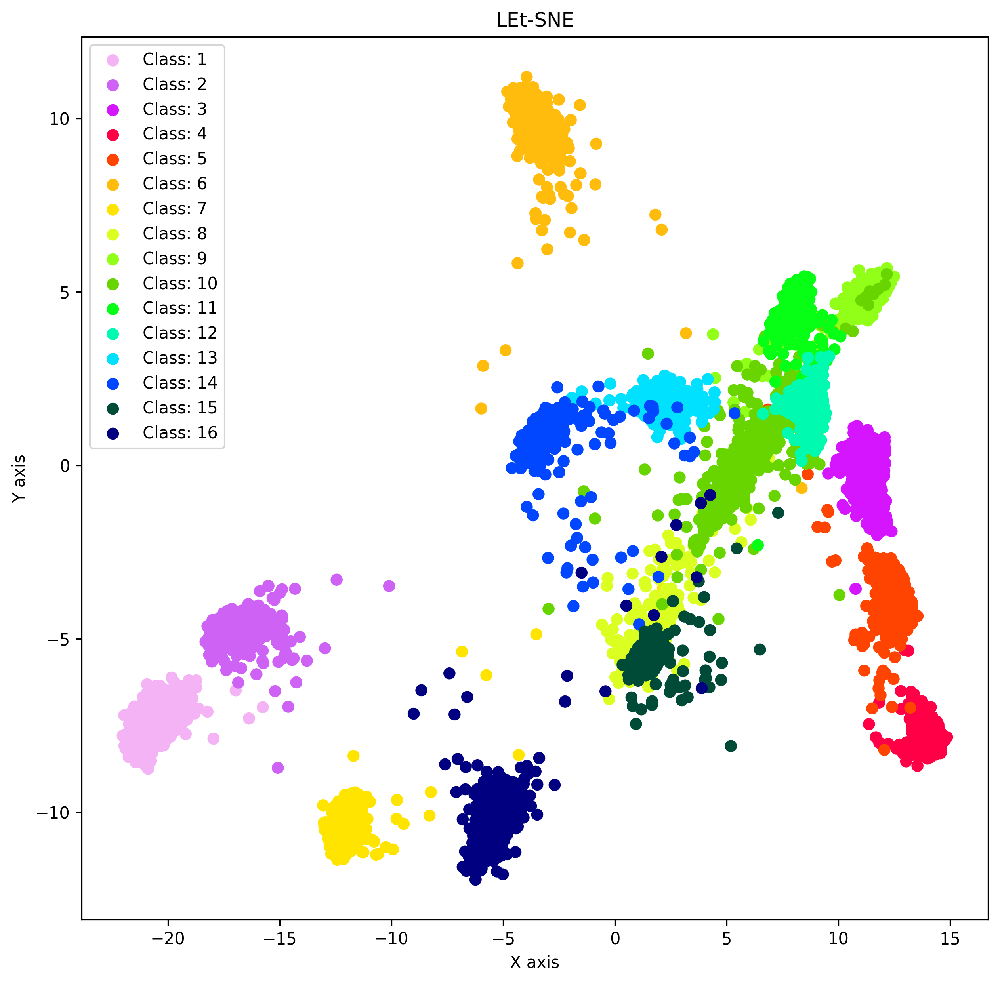

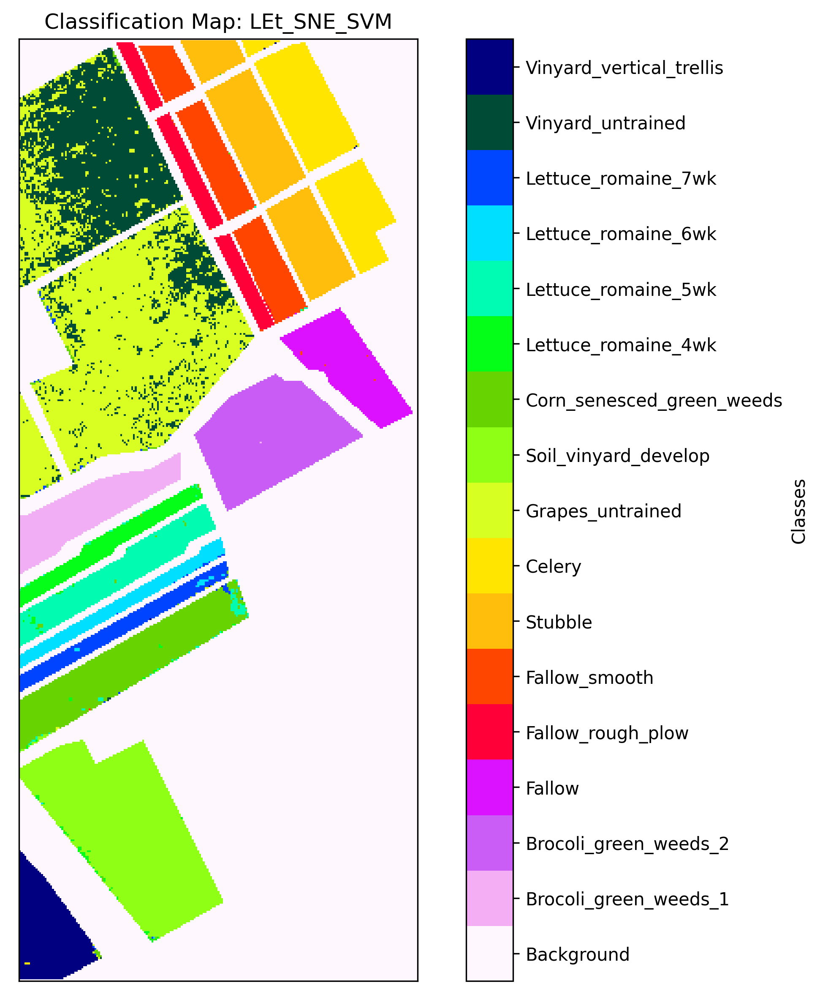

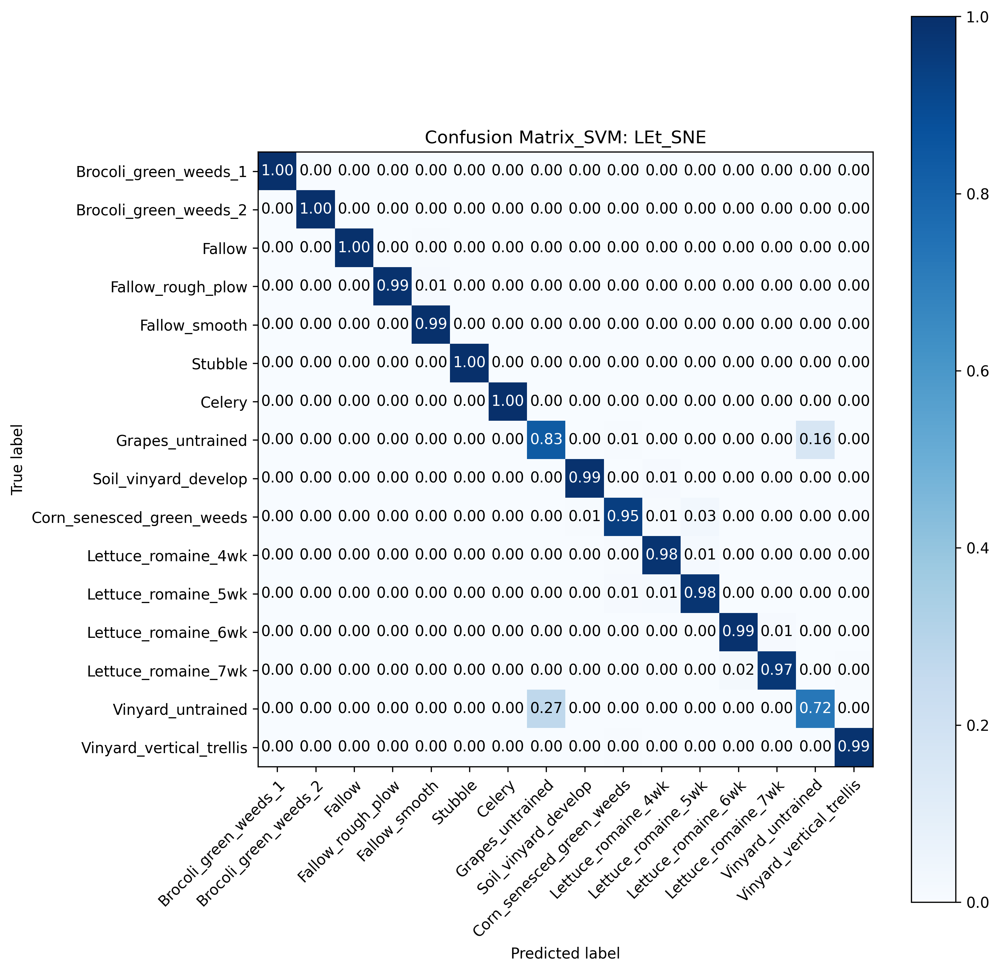

In [18]:
# Defining the model, configuration
let_sne_ = tf.estimator.Estimator(model_fn=let_sne,
                                  model_dir=os.path.join(TENSORBOARD_DIR,'LEt_SNE'),
                                  config=tf.estimator.RunConfig(session_config=config,
                                                                keep_checkpoint_max=20),
                                  params={'hidden': HIDDEN,
                                          'loss_weights': LOSS_WEIGHTS,
                                          'convolution': False}
                                  )

# Training the algorithm
if LABEL:
    let_sne_.train(input_fn=lambda: dataset_tf(trainBands, trainLabels, train=True))
else:
    # No separate MANIFOLD condition as it does not use label information for adjacency (uses kNN) 
    # Therefore else is equivalent to MANIFOLD, SEGMENTATION 
    let_sne_.train(input_fn=lambda: dataset_tf(trainBands, trainSeg, train=True))
            
# Prediction: We provide Labels since dataset_tf() takes it as argument, however it is not used in inference
train_encoding = predictor(trainBands, trainLabels, let_sne_, 'encoded')
test_encoding = predictor(testBands, testLabels, let_sne_, 'encoded')
image_encoding = predictor(inputData.astype(np.float64), inputLabel, let_sne_, 'encoded')

# Visualize encodings
visualize_encoding(test_encoding, testLabels, title='LEt-SNE')

# Computing SVMs
print('\nComputing SVM of LEt-SNE data. This may take some time.\n')
kappa_algo['LEt-SNE'] = svm_classification(image_encoding, train_encoding, trainLabels,
                                           test_encoding, testLabels, text='LEt_SNE')


Let us also examine the results we get when fitting a SVM decision boundary on the original dataset.


Computing SVC of the original data. This may take some time.



Kappa Score SVM: Original: 0.9422642652950278


SVM Classification Accuracy: Original
0.94808793




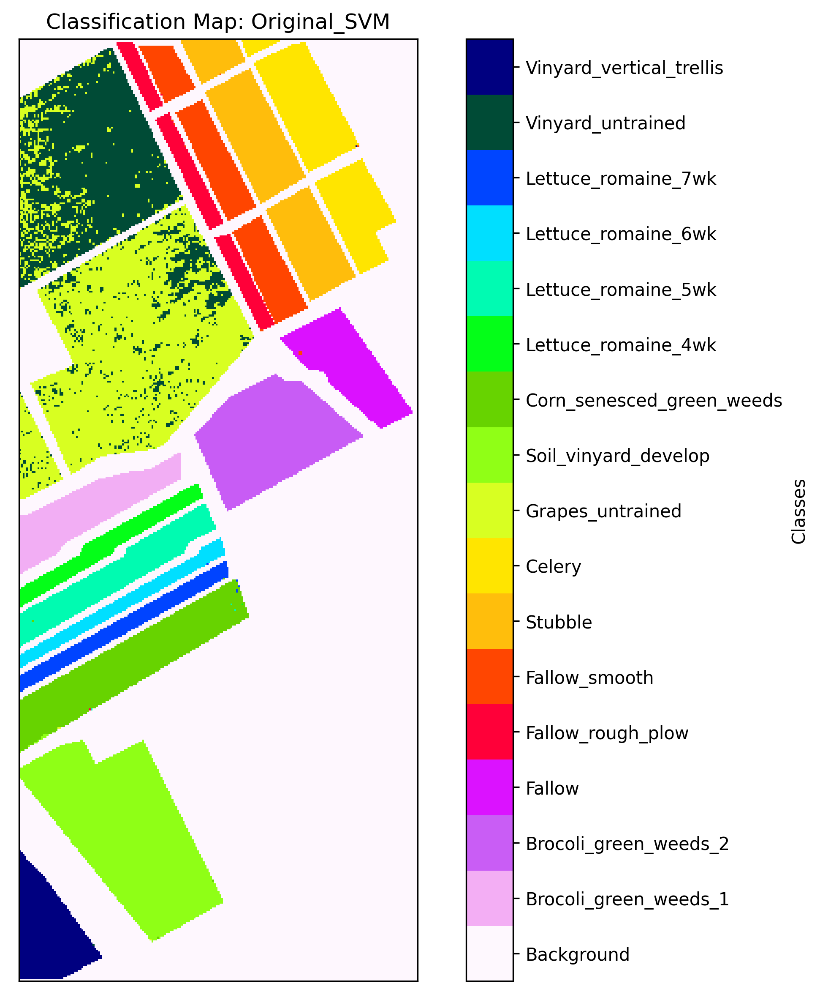

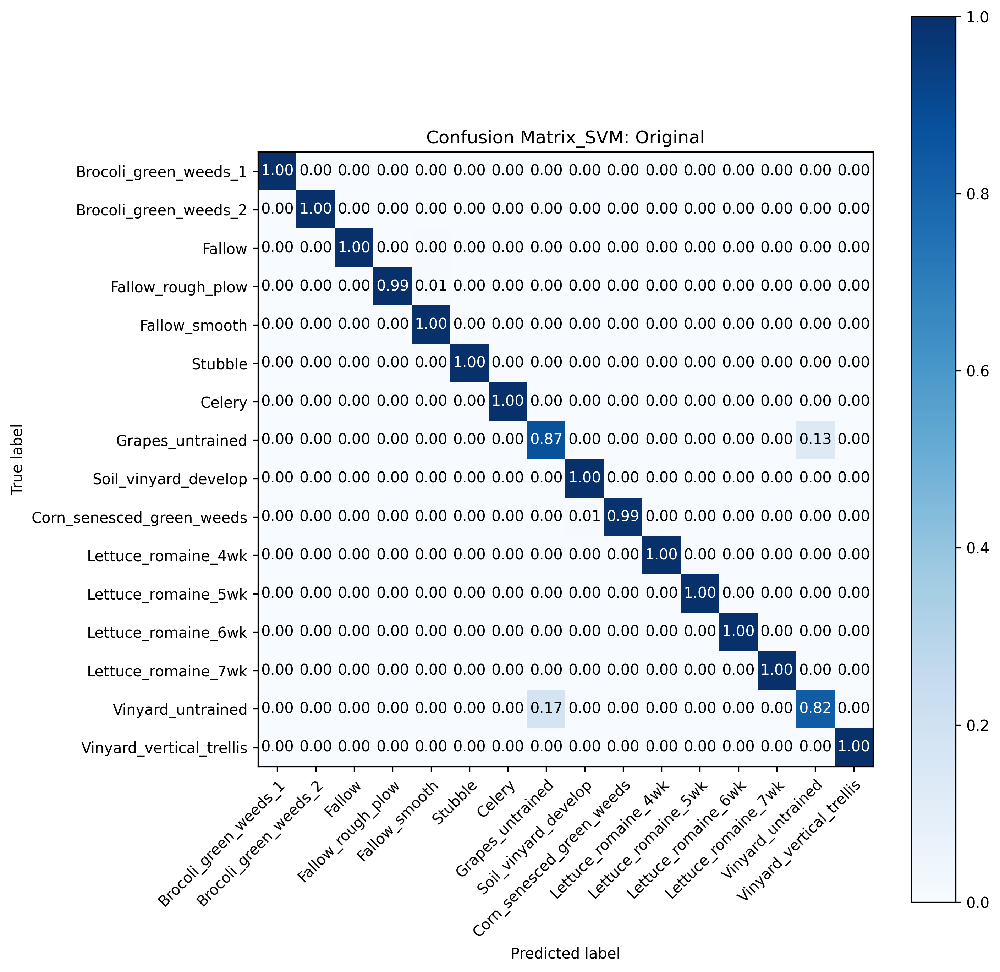

In [19]:
print('\nComputing SVC of the original data. This may take some time.\n')
kappa_algo['Original'] = svm_classification(inputData, trainBands, trainLabels, testBands, testLabels, text='Original')



We now observe the embeddings and kappa classification values for the Principal Component Transformation.


Computing SVM of PCA reduced data. This may take some time.



Kappa Score SVM: PCA: 0.8089224583035509


SVM Classification Accuracy: PCA
0.8274524




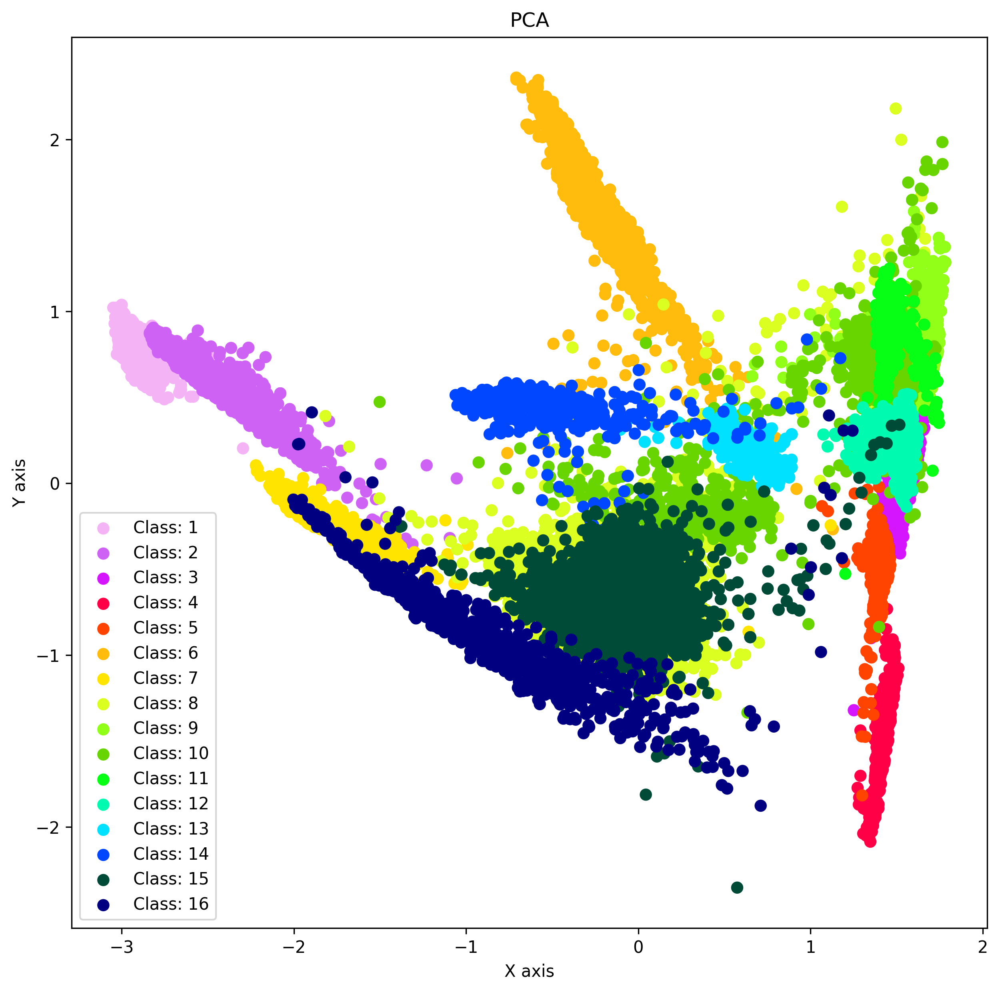

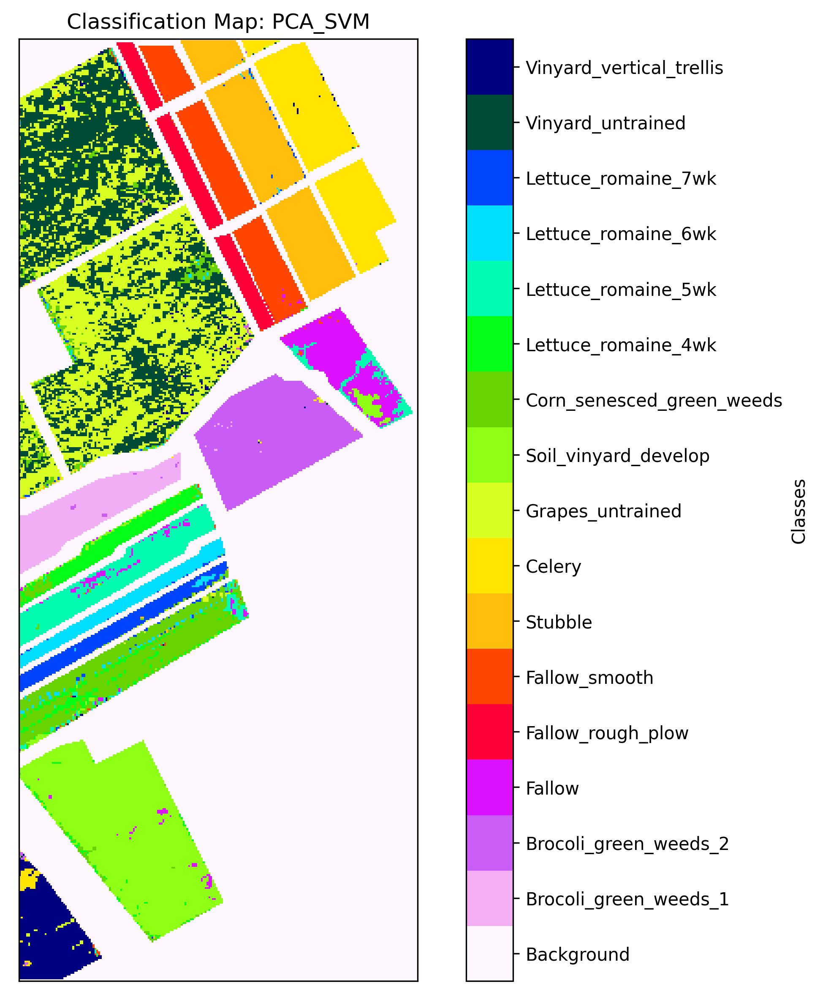

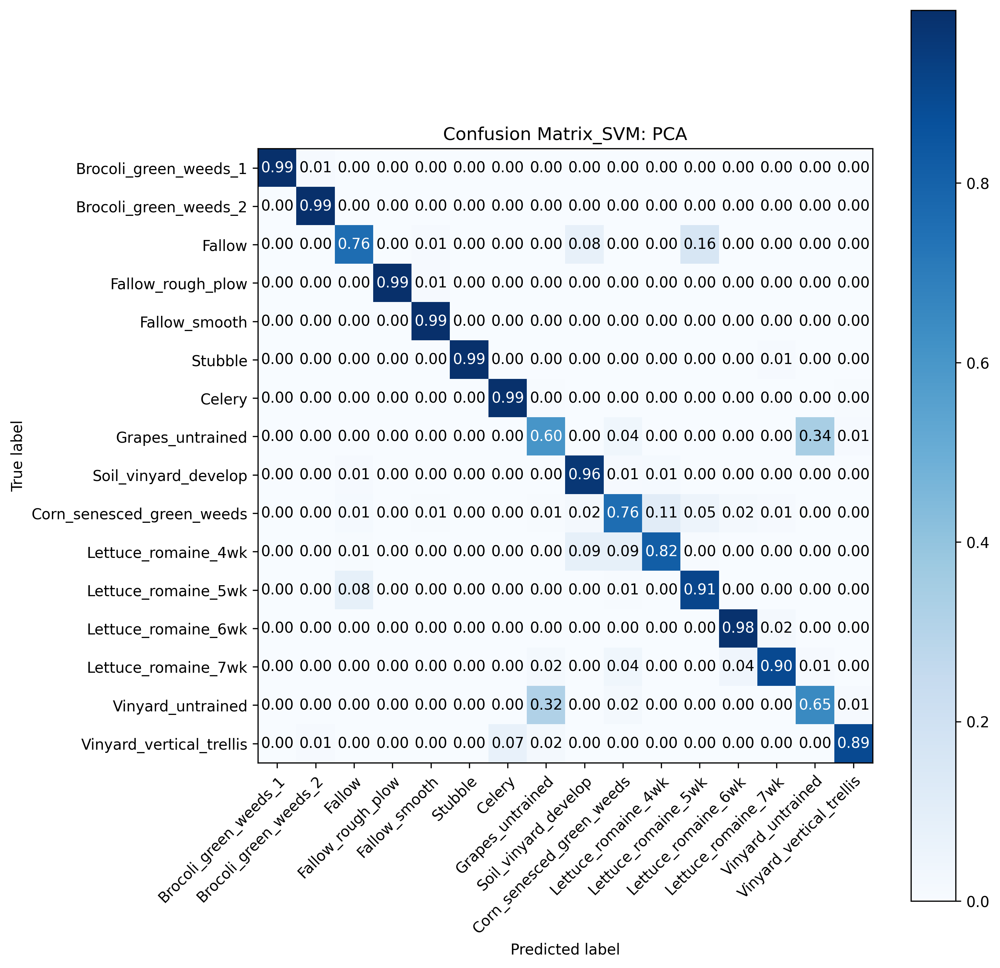

In [20]:
train_pca, test_pca, image_pca = principal_componenet_analysis(train=trainBands,
                                                               test=testBands,
                                                               n_components=DIM_REDUCED,
                                                               image=inputData)
visualize_encoding(test_pca, testLabels, title='PCA')
print('\nComputing SVM of PCA reduced data. This may take some time.\n')
kappa_algo['PCA'] = svm_classification(image_pca, train_pca, trainLabels, test_pca, testLabels, text='PCA')

Linear Discriminant Analysis uses class gaussian distribution assumption to model the embeddings.


Computing SVM of LDA reduced data. This may take some time.



Kappa Score SVM: LDA: 0.5486366784384891


SVM Classification Accuracy: LDA
0.5878441




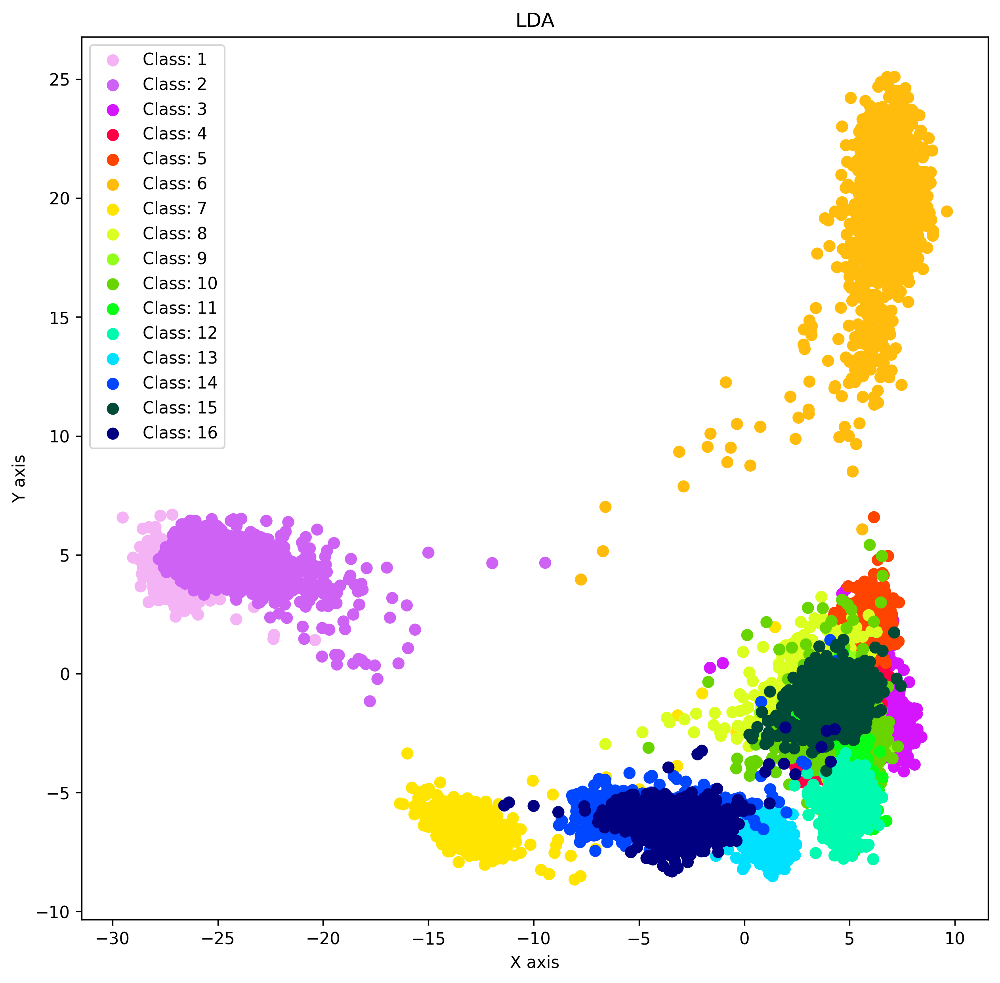

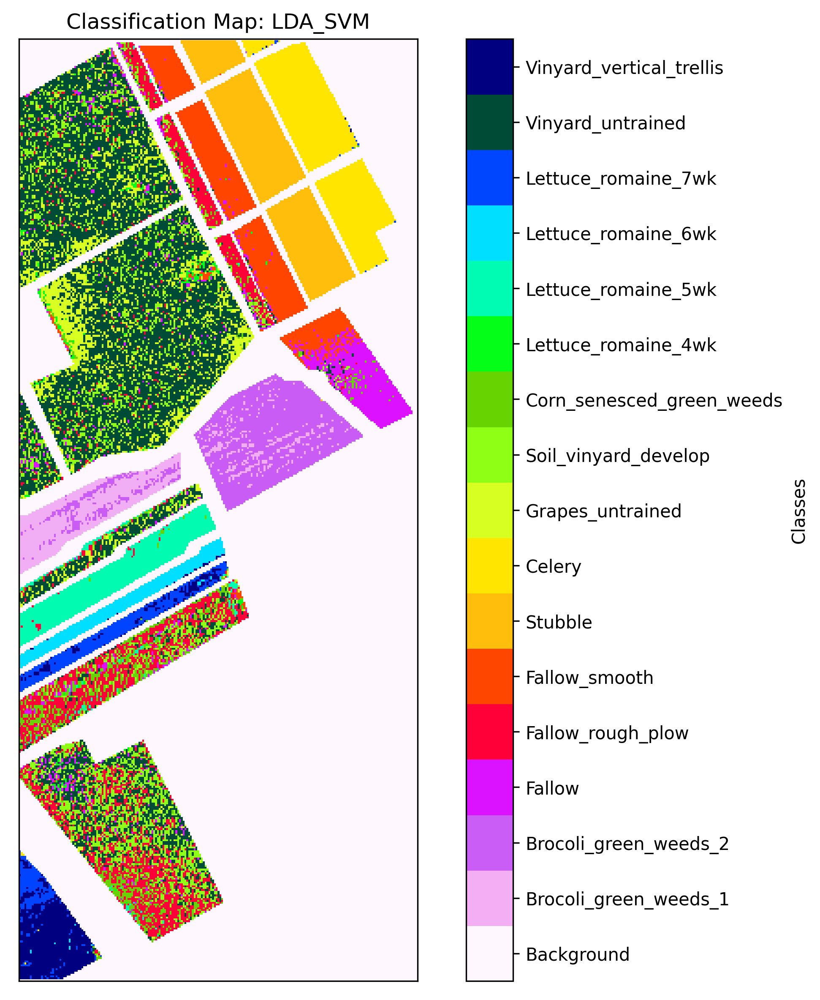

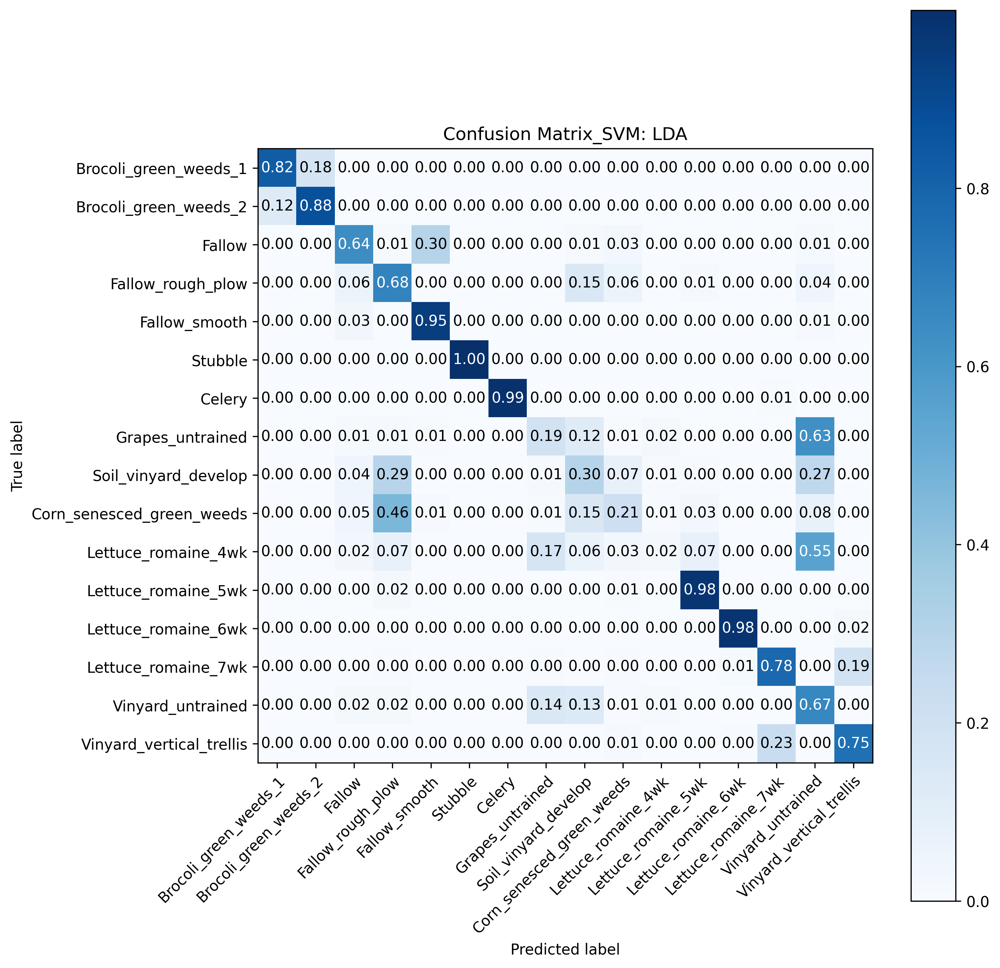

In [21]:
train_lda, test_lda, image_lda = linear_discriminant_analysis(train=trainBands,
                                                              test=testBands,
                                                              n_components=DIM_REDUCED,
                                                              image=inputData,
                                                              labels=trainLabels)

visualize_encoding(test_lda, testLabels, title='LDA')
print('\nComputing SVM of LDA reduced data. This may take some time.\n')
kappa_algo['LDA'] = svm_classification(image_lda, train_lda, trainLabels, test_lda, testLabels, text='LDA')

UMAP is a popular technique for manifold learning and visualization.  


Computing UMAP. This may take a lot of time.

Computing SVM of UMAP reduced data. This may take some time.



Kappa Score SVM: UMAP: 0.8911156221508787


SVM Classification Accuracy: UMAP
0.9022723




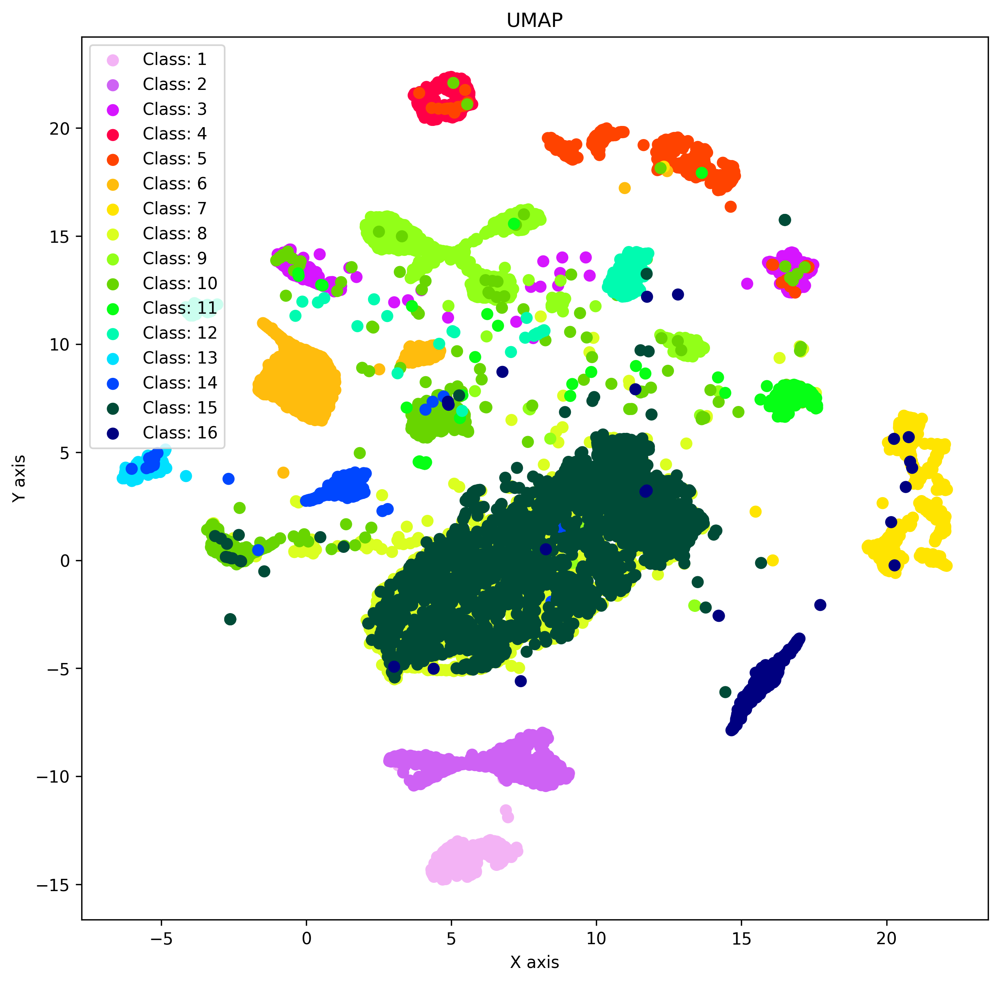

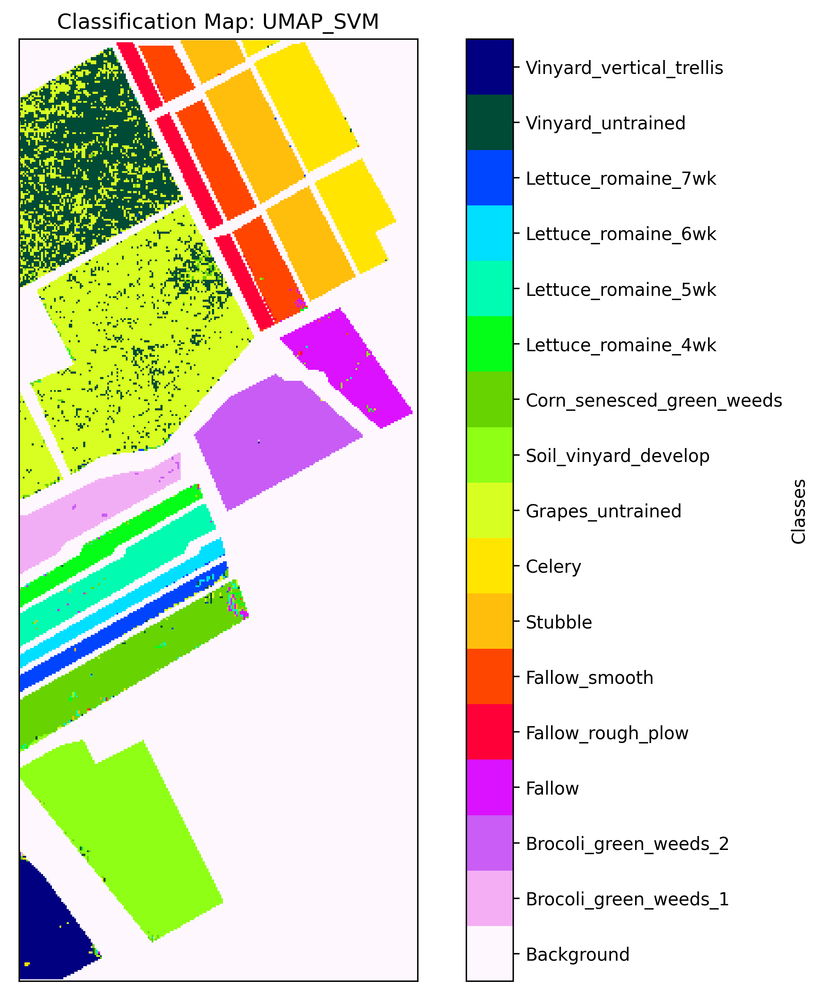

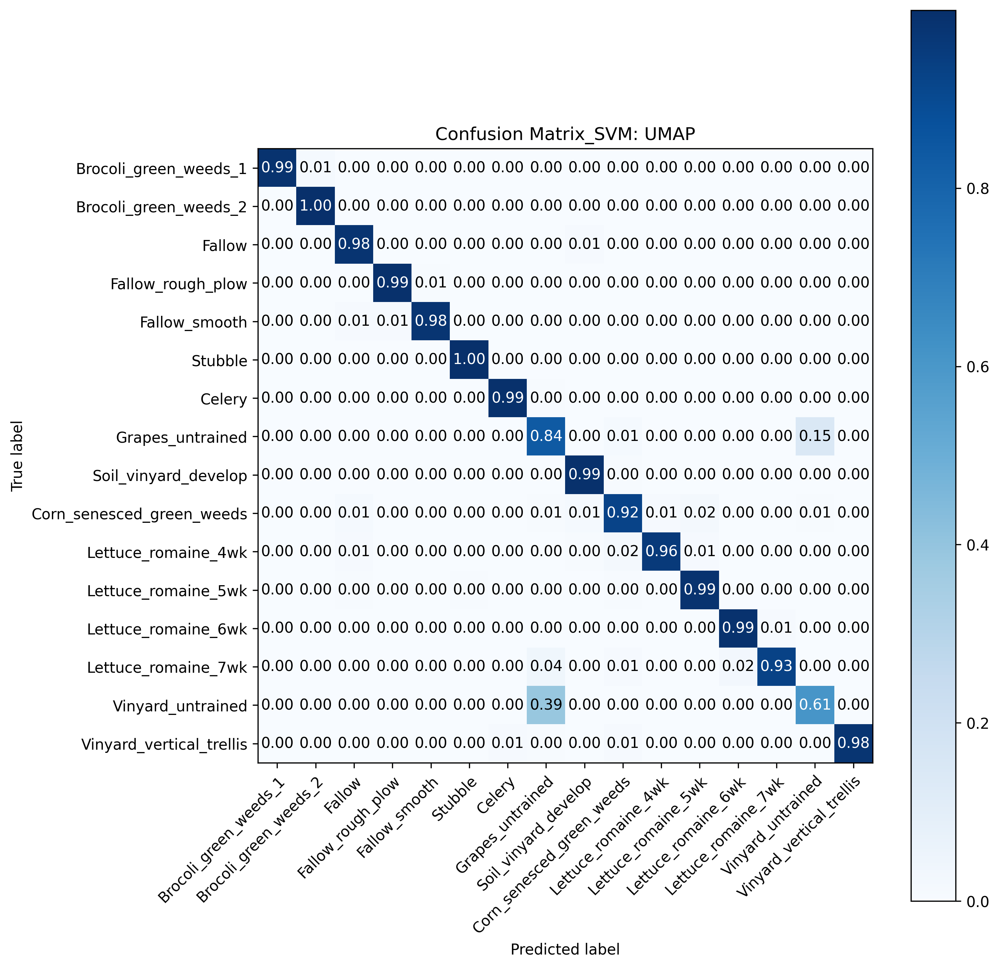

In [22]:
print('\nComputing UMAP. This may take a lot of time.')
train_umap, test_umap, image_umap = umap_fn(train=trainBands,
                                            test=testBands,
                                            label=trainLabels,
                                            n_components=DIM_REDUCED,
                                            image=inputData)

visualize_encoding(test_umap, testLabels, title='UMAP')
print('\nComputing SVM of UMAP reduced data. This may take some time.\n')
kappa_algo['UMAP'] = svm_classification(image_umap, train_umap, trainLabels, test_umap, testLabels, text='UMAP')

We perform our evaluation using the autoencoder. 

INFO:tensorflow:Using config: {'_model_dir': '/content/TensorBoard_1/Autoencoder', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 20, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_experimental_max_worker_delay_secs': None, '_session_creation_timeout_secs': 7200, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x7f3573a6e160>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Batches created
INFO:tensorflow:1. Dataset element 
Type: (

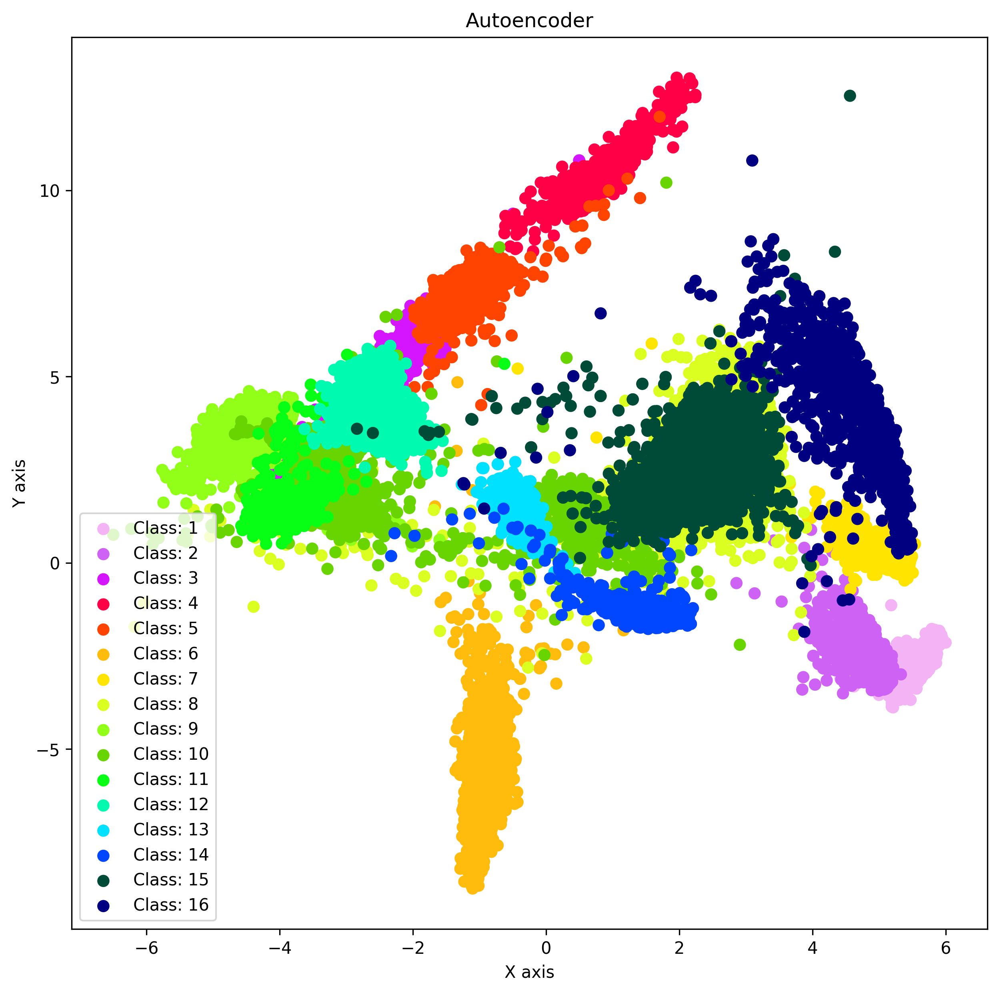

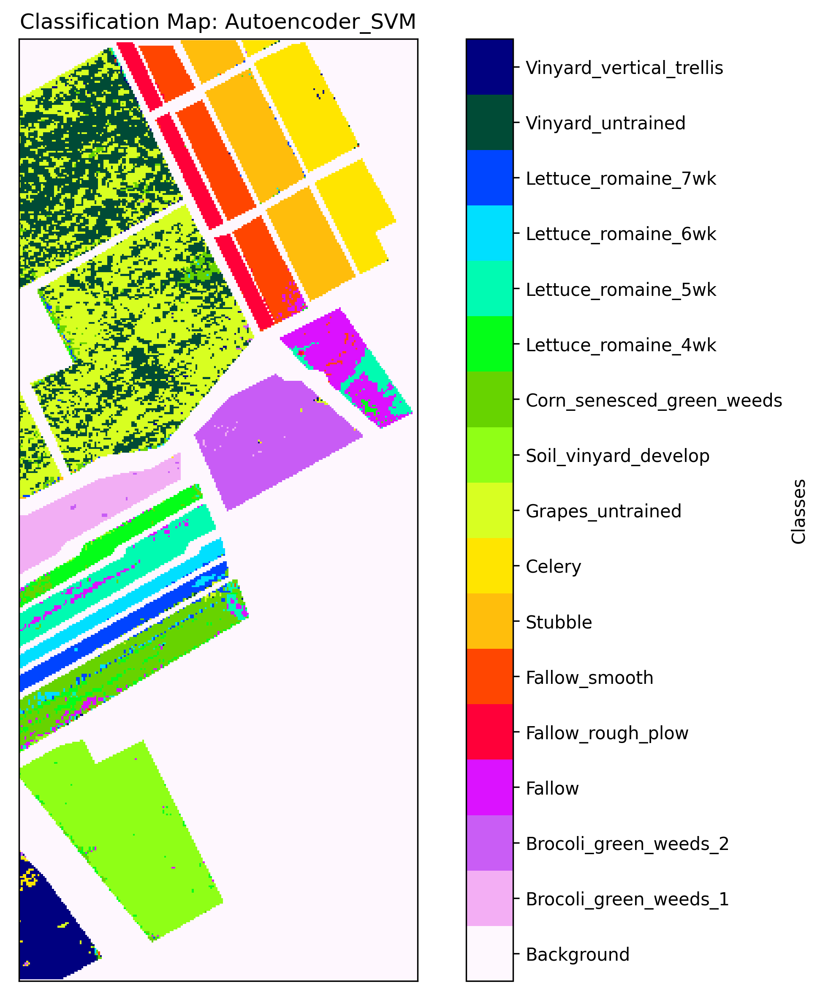

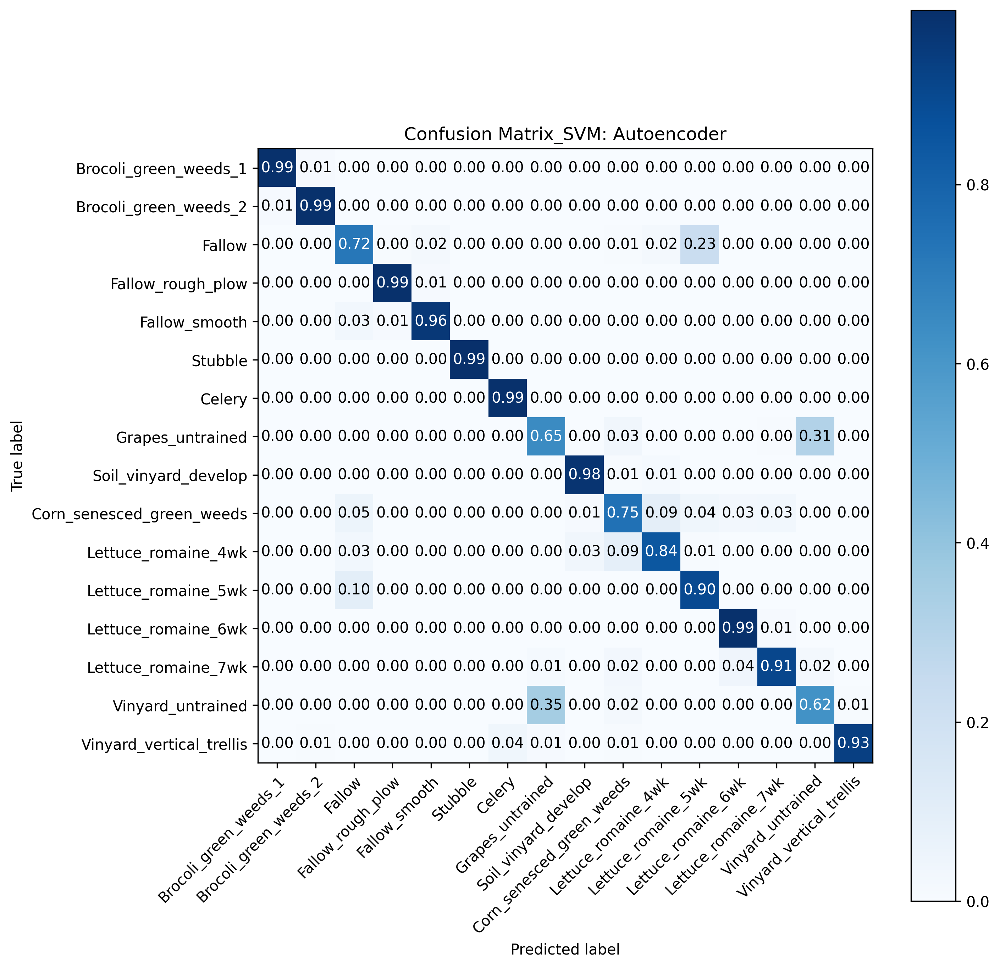

In [23]:
# Using the architecture defined in LEt-SNE as an autoencoder by keeping reconstruction loss only.
LOSS_WEIGHTS = np.array([0.0, 0.0, 1.0], dtype=np.float32)
# [Laplacian Eigenmap, t-SNE = 1 (SEG, LAB) = 5 (MANIFOLD), Reconstruction]

# Defining the model, configuration for Autoencoder
autoencoder = tf.estimator.Estimator(model_fn=let_sne,
                                     model_dir=os.path.join(TENSORBOARD_DIR,'Autoencoder'),
                                     config=tf.estimator.RunConfig(session_config=config,
                                                                   keep_checkpoint_max=20),
                                     params={'hidden': HIDDEN,
                                             'loss_weights': LOSS_WEIGHTS,
                                             'convolution': False}
                                     )

# Training the algorithm
if LABEL:
    autoencoder.train(input_fn=lambda: dataset_tf(trainBands, trainLabels, train=True))
else:
    # No separate MANIFOLD condition as it does not use label information for adjacency (uses kNN) 
    # Therefore else is equivalent to MANIFOLD, SEGMENTATION 
    autoencoder.train(input_fn=lambda: dataset_tf(trainBands, trainSeg, train=True))
            
# Prediction: We provide Labels since dataset_tf() takes it as argument, however it is not used in inference
train_encoding = predictor(trainBands, trainLabels, autoencoder, 'encoded')
test_encoding = predictor(testBands, testLabels, autoencoder, 'encoded')
image_encoding = predictor(inputData.astype(np.float64), inputLabel, autoencoder, 'encoded')

# Visualize encodings
visualize_encoding(test_encoding, testLabels, title='Autoencoder')

# Computing SVMs
print('\nComputing SVM of Autoencoder data. This may take some time.\n')
kappa_algo['Autoencoder'] = svm_classification(image_encoding, train_encoding, trainLabels,
                                               test_encoding, testLabels, text='Autoencoder')


Now, let us evaluate t-SNE visualization of our dataset.
Since t-SNE lacks a prediction function, it is not trivial to compute the embeddings and therefore we will not classify the test dataset.


Computing tSNE dimensionality reduction. This may take a lot of time.

[t-SNE] Computing 76 nearest neighbors...
[t-SNE] Indexed 27065 samples in 0.819s...
[t-SNE] Computed neighbors for 27065 samples in 53.515s...
[t-SNE] Computed conditional probabilities for sample 1000 / 27065
[t-SNE] Computed conditional probabilities for sample 2000 / 27065
[t-SNE] Computed conditional probabilities for sample 3000 / 27065
[t-SNE] Computed conditional probabilities for sample 4000 / 27065
[t-SNE] Computed conditional probabilities for sample 5000 / 27065
[t-SNE] Computed conditional probabilities for sample 6000 / 27065
[t-SNE] Computed conditional probabilities for sample 7000 / 27065
[t-SNE] Computed conditional probabilities for sample 8000 / 27065
[t-SNE] Computed conditional probabilities for sample 9000 / 27065
[t-SNE] Computed conditional probabilities for sample 10000 / 27065
[t-SNE] Computed conditional probabilities for sample 11000 / 27065
[t-SNE] Computed conditional probabilities fo

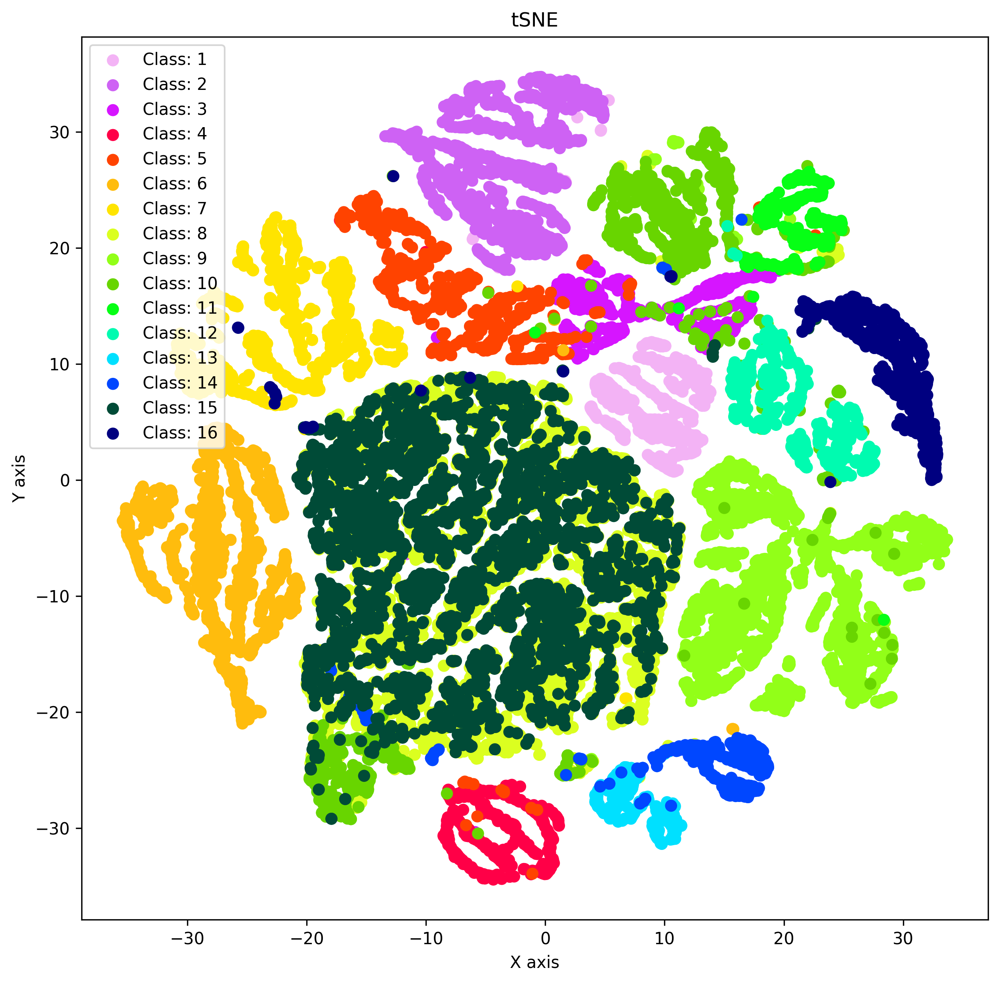

In [24]:
print('\nComputing tSNE dimensionality reduction. This may take a lot of time.\n')
test_tsne, image_tsne = tsne_fn(train=trainBands, test=testBands, n_components=DIM_REDUCED, image=inputData)
visualize_encoding(test_tsne, testLabels, title='tSNE')

In our final result, we compare the kappa scores for all the algorithms (except t-SNE) that we have used.
The kappa score accounts for class imbalances and is therefore a better metric than accuracy for model comparison

In [25]:
print(kappa_algo)

{'LEt-SNE': 0.9122962036823987, 'Original': 0.9422642652950278, 'PCA': 0.8089224583035509, 'LDA': 0.5486366784384891, 'UMAP': 0.8911156221508787, 'Autoencoder': 0.8147101116587052}


It is interesting to observe both the performance measures: the Kappa scores as well as the confusion matrix for all the algorithms. <br> LEt-SNE performs a reasonable job grouping and separating samples, especially in two dimensions against the 200+ dimensions in the original dataset. <br>

We encourage the user to compare the performance of various algorithms on the classes: *Grapes_untrained* and *Vinyard_untrained* in the confusion matrix. These classes pose a significant challenge due to the overlap in between them. <br>


A similar performance is seen on other datasets, Indian Pines and Pavia University. Feel free to change the dataset and re-run these experiments!